## 0.0 Configurações e carregamentos iniciais

In [2]:
# Instalar bibliotecas
!pip install pyspark
!pip install kagglehub
!pip install shap

In [3]:
# IPython, Notebook e Gestão de Arquivos
from IPython import get_ipython
import nbformat
from IPython.display import display

# Manipulação de Dados
import pandas as pd
import numpy as np
from datetime import datetime, timedelta, date
from dateutil.relativedelta import relativedelta

# Spark
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from pyspark.sql.types import (
    ArrayType, StringType, StructType, StructField
)
from pyspark.ml.feature import StringIndexer, VectorAssembler, MinMaxScaler, StandardScaler
from pyspark.ml.stat import ChiSquareTest

# Estatística
from scipy import stats
from scipy.stats import shapiro, kruskal, chi2_contingency, skew, norm

# Machine Learning (Scikit-Learn, Imbalanced Learn)
from sklearn.model_selection import (
    train_test_split, cross_val_score, KFold, validation_curve,
    GridSearchCV, RandomizedSearchCV, cross_validate
)
from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
)
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import Ridge, Lasso, LogisticRegression
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report,
    roc_auc_score, recall_score, roc_curve, make_scorer
)
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# PCA e Estatísticas Avançadas
from sklearn.decomposition import PCA
from statsmodels.api import OLS
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
import shap
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Visualização (Matplotlib, Seaborn, Plotly, Folium)
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import image as img
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import folium

# Outras Utilidades
from math import radians, sin, cos, sqrt, atan2
from functools import reduce
from joblib import Parallel, delayed
from tqdm import tqdm
import math
import glob
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter
import kagglehub
import builtins

In [4]:
def plot_img(img_array, plot_axis=False):
    '''
    img_array: é o retorno da função `keras.utils.img_to_array` que retorna o array da imagem considerando o formato RGB
    '''
    img_pil = Image.fromarray(img_array.astype('uint8'))
    if plot_axis:
        return plt.imshow(img_pil)
    return img_pil


def plot_nn(model, settings={}):
    visualizer(model, file_name='/tmp/output', file_format='png', view=True, settings=settings)
    img = Image.open('/tmp/output.png')
    return img


def plot_random_imgs(df, rows=2, columns=5, figsize=(8, 4), show_predictions=False):
    fig, axs = plt.subplots(rows, columns, figsize=figsize)

    idx_img = list(np.random.choice(list(df.index), rows*columns, replace=False))
    print(idx_img)
    for i, ax in enumerate(axs.flat):
        title = f'{df.target.iloc[idx_img[i]]}'

        if show_predictions and 'predicted_class' in df.columns:
            title = title + f' | Pred:{df.predicted_class.iloc[idx_img[i]]} ( {df.target_proba.iloc[idx_img[i]]:.3f})'

        ax.imshow(plt.imread(df.full_path.iloc[idx_img[i]]))
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()

def plot_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

    ax1.plot(history.history['loss'], 'r-', label='train loss')
    ax1.plot(history.history['val_loss'], 'b--', label='test loss')
    ax1.set_title('Model Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')

    ax1.legend()

    ax2.plot(history.history['accuracy'], 'r-', label='train acc')
    ax2.plot(history.history['val_accuracy'], 'b--', label='test acc')
    ax2.set_title('Model Accuracy')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy')
    ax2.legend()

    plt.tight_layout()

def save_obj(obj, full_path):
    try:
        joblib.dump(obj, full_path)
    except Exception as e:
        print(e)

def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371  # Radius of Earth in kilometers
    lat1_rad, lon1_rad = radians(lat1), radians(lon1)
    lat2_rad, lon2_rad = radians(lat2), radians(lon2)
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad
    a = sin(dlat / 2)**2 + cos(lat1_rad) * cos(lat2_rad) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c

In [6]:
spark = SparkSession.builder.master("local").appName("FraudeIFood").getOrCreate()

In [5]:
# Baixar a versão mais recente
path = kagglehub.dataset_download("kartik2112/fraud-detection")

print("Path to dataset files:", path)

100%|██████████| 202M/202M [00:01<00:00, 163MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/kartik2112/fraud-detection/versions/1


In [7]:
dataset_train_path = f"{path}/fraudTrain.csv"

# Carregar o CSV no DataFrame do PySpark
df_train = spark.read.csv(dataset_train_path, header=True, inferSchema=True)

# Verificar as primeiras linhas para garantir que o carregamento funcionou
df_train.show(5)

+---+---------------------+----------------+--------------------+-------------+------+---------+-------+------+--------------------+--------------+-----+-----+-------+---------+--------+--------------------+----------+--------------------+----------+------------------+-----------+--------+
|_c0|trans_date_trans_time|          cc_num|            merchant|     category|   amt|    first|   last|gender|              street|          city|state|  zip|    lat|     long|city_pop|                 job|       dob|           trans_num| unix_time|         merch_lat| merch_long|is_fraud|
+---+---------------------+----------------+--------------------+-------------+------+---------+-------+------+--------------------+--------------+-----+-----+-------+---------+--------+--------------------+----------+--------------------+----------+------------------+-----------+--------+
|  0|  2019-01-01 00:00:18|2703186189652095|fraud_Rippin, Kub...|     misc_net|  4.97| Jennifer|  Banks|     F|      561 Perry 

In [8]:
# Distribuição de fraude e não fraude
distribuicao_fraude = df_train.groupBy('is_fraud').count()

# Calcular a soma total para cálculo dos percentuais
total_fraude = distribuicao_fraude.groupBy().sum("count").first()[0]

# Adicionar coluna de percentuais ao DataFrame agrupado
# Usar a função round do PySpark para arredondar o resultado da coluna
distribuicao_fraude = distribuicao_fraude.withColumn("percent", round((col("count") / total_fraude) * 100, 4))

# Exibir o DataFrame com os percentuais
distribuicao_fraude.show()

+--------+-------+-------+
|is_fraud|  count|percent|
+--------+-------+-------+
|       1|   7506| 0.5789|
|       0|1289169|99.4211|
+--------+-------+-------+



In [9]:
dataset_test_path = f"{path}/fraudTest.csv"

# Carregar o CSV no DataFrame do PySpark
df_test = spark.read.csv(dataset_test_path, header=True, inferSchema=True)

# Verificar as primeiras linhas para garantir que o carregamento funcionou
df_test.show(5)

+---+---------------------+----------------+--------------------+--------------+-----+------+--------+------+--------------------+----------+-----+-----+-------+------------------+--------+--------------------+----------+--------------------+----------+------------------+-----------+--------+
|_c0|trans_date_trans_time|          cc_num|            merchant|      category|  amt| first|    last|gender|              street|      city|state|  zip|    lat|              long|city_pop|                 job|       dob|           trans_num| unix_time|         merch_lat| merch_long|is_fraud|
+---+---------------------+----------------+--------------------+--------------+-----+------+--------+------+--------------------+----------+-----+-----+-------+------------------+--------+--------------------+----------+--------------------+----------+------------------+-----------+--------+
|  0|  2020-06-21 12:14:25|2291163933867244|fraud_Kirlin and ...| personal_care| 2.86|  Jeff| Elliott|     M|   351 Da

In [10]:
# Distribuição de fraude e não fraude
distribuicao_fraude = df_test.groupBy('is_fraud').count()

# Calcular a soma total para cálculo dos percentuais
total_fraude = distribuicao_fraude.groupBy().sum("count").first()[0]

# Adicionar coluna de percentuais ao DataFrame agrupado
# Usar a função round do PySpark para arredondar o resultado da coluna
distribuicao_fraude = distribuicao_fraude.withColumn("percent", round((col("count") / total_fraude) * 100, 4))

# Exibir o DataFrame com os percentuais
distribuicao_fraude.show()

+--------+------+-------+
|is_fraud| count|percent|
+--------+------+-------+
|       1|  2145|  0.386|
|       0|553574| 99.614|
+--------+------+-------+



In [11]:
df_complete = df_train.union(df_test)

In [12]:
# Converter unix_time para ano da transação
df_complete = (
    df_complete
    .withColumn("year_trnsc", year(from_unixtime(col("unix_time"))))
    .withColumn("hour_trnsc", hour(from_unixtime(col("unix_time"))))
)

# Calcular a idade
df_complete = df_complete.withColumn("age", col("year_trnsc") - year(col("dob")))

In [13]:
df_complete.show(5)

+---+---------------------+----------------+--------------------+-------------+------+---------+-------+------+--------------------+--------------+-----+-----+-------+---------+--------+--------------------+----------+--------------------+----------+------------------+-----------+--------+----------+----------+---+
|_c0|trans_date_trans_time|          cc_num|            merchant|     category|   amt|    first|   last|gender|              street|          city|state|  zip|    lat|     long|city_pop|                 job|       dob|           trans_num| unix_time|         merch_lat| merch_long|is_fraud|year_trnsc|hour_trnsc|age|
+---+---------------------+----------------+--------------------+-------------+------+---------+-------+------+--------------------+--------------+-----+-----+-------+---------+--------+--------------------+----------+--------------------+----------+------------------+-----------+--------+----------+----------+---+
|  0|  2019-01-01 00:00:18|2703186189652095|fraud

In [14]:
# Salvar o DataFrame PySpark em um arquivo CSV local
df_complete.write.parquet("df_complete_output.parquet", mode="overwrite")

In [15]:
# Carregar o Parquet em um DataFrame Pandas
df_complete_pd = pd.read_parquet("df_complete_output.parquet")

In [16]:
colors = ['#FFC400', '#FF3C53', '#F85713', '#9321B2', '#0073E6', '#FFAAB4', '#FF7824', '#EA9EFF', '#72E7FB', '#005838', '#90E05F', '#91f5cd']

## 1.0 Análise exploratória de dados (EDA)

In [20]:
# Verificar o schema do DataFrame
df_complete.printSchema()

root
 |-- _c0: integer (nullable = true)
 |-- trans_date_trans_time: timestamp (nullable = true)
 |-- cc_num: long (nullable = true)
 |-- merchant: string (nullable = true)
 |-- category: string (nullable = true)
 |-- amt: double (nullable = true)
 |-- first: string (nullable = true)
 |-- last: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- street: string (nullable = true)
 |-- city: string (nullable = true)
 |-- state: string (nullable = true)
 |-- zip: integer (nullable = true)
 |-- lat: double (nullable = true)
 |-- long: double (nullable = true)
 |-- city_pop: integer (nullable = true)
 |-- job: string (nullable = true)
 |-- dob: date (nullable = true)
 |-- trans_num: string (nullable = true)
 |-- unix_time: integer (nullable = true)
 |-- merch_lat: double (nullable = true)
 |-- merch_long: double (nullable = true)
 |-- is_fraud: integer (nullable = true)
 |-- year_trnsc: integer (nullable = true)
 |-- hour_trnsc: integer (nullable = true)
 |-- age: integer (nu

In [21]:
# Obter informações gerais do dataset
df_complete.describe().show()

+-------+------------------+--------------------+-------------------+-------------+-----------------+-------+-------+-------+--------------------+-------+-------+------------------+------------------+------------------+-----------------+------------------+--------------------+--------------------+------------------+------------------+--------------------+------------------+------------------+------------------+
|summary|               _c0|              cc_num|           merchant|     category|              amt|  first|   last| gender|              street|   city|  state|               zip|               lat|              long|         city_pop|               job|           trans_num|           unix_time|         merch_lat|        merch_long|            is_fraud|        year_trnsc|        hour_trnsc|               age|
+-------+------------------+--------------------+-------------------+-------------+-----------------+-------+-------+-------+--------------------+-------+-------+--------

In [22]:
df_complete = df_complete.drop("_c0")

In [23]:
# Contar o número de transações únicas na coluna 'trans_num'
count_total_transacoes = df_complete.select("trans_num").count()
count_unicas_transacoes = df_complete.select("trans_num").distinct().count()

print(f"Total de transações: {count_total_transacoes}")
print(f"Total de transações únicas: {count_unicas_transacoes}")

Total de transações: 1852394
Total de transações únicas: 1852394


In [24]:
# Distribuição de fraude e não fraude
distribuicao_fraude = df_complete.groupBy('is_fraud').count()

# Calcular a soma total para cálculo dos percentuais
total_fraude = distribuicao_fraude.groupBy().sum("count").first()[0]

# Adicionar coluna de percentuais ao DataFrame agrupado
# Usar a função round do PySpark para arredondar o resultado da coluna
distribuicao_fraude = distribuicao_fraude.withColumn("percent", round((col("count") / total_fraude) * 100, 4))

# Exibir o DataFrame com os percentuais
distribuicao_fraude.show()

+--------+-------+-------+
|is_fraud|  count|percent|
+--------+-------+-------+
|       1|   9651|  0.521|
|       0|1842743| 99.479|
+--------+-------+-------+



In [25]:
# Calcular a soma total de valores (`amt`) por `is_fraud`
distribuicao_amt_fraude = df_complete.groupBy("is_fraud").agg(
    sum("amt").alias("total_amt")  # Soma de valores por `is_fraud`
)

# Calcular a soma geral de valores para calcular os percentuais
soma_total_amt = distribuicao_amt_fraude.groupBy().sum("total_amt").first()[0]

# Adicionar coluna de percentuais ao DataFrame agrupado
distribuicao_amt_fraude = distribuicao_amt_fraude.withColumn(
    "percent", round((col("total_amt") / soma_total_amt) * 100, 4)  # Calcular porcentagem e arredondar para 4 casas decimais
)

# Exibir o DataFrame com os percentuais
distribuicao_amt_fraude.show()

+--------+--------------------+-------+
|is_fraud|           total_amt|percent|
+--------+--------------------+-------+
|       1|   5121413.289999996| 3.9461|
|       0|1.2466391872000134E8|96.0539|
+--------+--------------------+-------+



In [26]:
# Exemplo de limpeza: Verificação de valores nulos
valores_nulos = df_complete.select([count(when(col(c).isNull(), c)).alias(c) for c in df_complete.columns])
valores_nulos.show()

+---------------------+------+--------+--------+---+-----+----+------+------+----+-----+---+---+----+--------+---+---+---------+---------+---------+----------+--------+----------+----------+---+
|trans_date_trans_time|cc_num|merchant|category|amt|first|last|gender|street|city|state|zip|lat|long|city_pop|job|dob|trans_num|unix_time|merch_lat|merch_long|is_fraud|year_trnsc|hour_trnsc|age|
+---------------------+------+--------+--------+---+-----+----+------+------+----+-----+---+---+----+--------+---+---+---------+---------+---------+----------+--------+----------+----------+---+
|                    0|     0|       0|       0|  0|    0|   0|     0|     0|   0|    0|  0|  0|   0|       0|  0|  0|        0|        0|        0|         0|       0|         0|         0|  0|
+---------------------+------+--------+--------+---+-----+----+------+------+----+-----+---+---+----+--------+---+---+---------+---------+---------+----------+--------+----------+----------+---+



#### 1.1. Estatísticas de valor das transações

In [27]:
# Estatísticas Descritivas da Variável 'amt'
estatisticas_amt = df_complete.select(
    mean(col("amt")).alias("mean"),
    stddev(col("amt")).alias("stddev"),
    min(col("amt")).alias("min"),
    max(col("amt")).alias("max")
)

# Mostrar as estatísticas calculadas
estatisticas_amt.show()

# Calcular Percentis (Exemplo: 25%, 50%, 75%)
percentis = df_complete.approxQuantile("amt", [0.25, 0.5, 0.75], 0.01)
print(f"Percentis de 'amt' - 25%: {percentis[0]}, 50% (Mediana): {percentis[1]}, 75%: {percentis[2]}")

+-----------------+-----------------+---+-------+
|             mean|           stddev|min|    max|
+-----------------+-----------------+---+-------+
|70.06356747538621|159.2539747739828|1.0|28948.9|
+-----------------+-----------------+---+-------+

Percentis de 'amt' - 25%: 9.45, 50% (Mediana): 47.55, 75%: 82.45


In [28]:
# Agrupamento por 'is_fraud' e cálculo das estatísticas de 'amt'
estatisticas_fraud = df_complete.groupBy("is_fraud").agg(
    mean(col("amt")).alias("mean_amt"),
    stddev(col("amt")).alias("stddev_amt"),
    min(col("amt")).alias("min_amt"),
    max(col("amt")).alias("max_amt"),
)

# Mostrar as estatísticas agrupadas
estatisticas_fraud.show()

# Calcular percentis por grupo 'is_fraud' (manual para cada grupo)
for value in [0, 1]:
    percentis = df_complete.filter(col("is_fraud") == value).approxQuantile("amt", [0.25, 0.5, 0.75], 0.01)
    print(f"Percentis de 'amt' para is_fraud={value} - 25%: {percentis[0]}, 50% (Mediana): {percentis[1]}, 75%: {percentis[2]}")

+--------+-----------------+------------------+-------+-------+
|is_fraud|         mean_amt|        stddev_amt|min_amt|max_amt|
+--------+-----------------+------------------+-------+-------+
|       1|530.6614122888816|     391.028872721|   1.06|1376.04|
|       0|67.65127786131943|153.54810775253355|    1.0|28948.9|
+--------+-----------------+------------------+-------+-------+

Percentis de 'amt' para is_fraud=0 - 25%: 9.39, 50% (Mediana): 47.38, 75%: 82.46
Percentis de 'amt' para is_fraud=1 - 25%: 220.43, 50% (Mediana): 368.47, 75%: 896.39


Transações fraudulentas possuem valores mais altos.

<ipython-input-29-dbb87776b72e>:1: UserWarning: The palette list has more values (12) than needed (2), which may not be intended.
  ax=sns.histplot(x='amt',data=df_complete_pd[df_complete_pd.amt<=1200],hue='is_fraud',stat='percent',multiple='dodge',common_norm=False,bins=25, palette=colors)


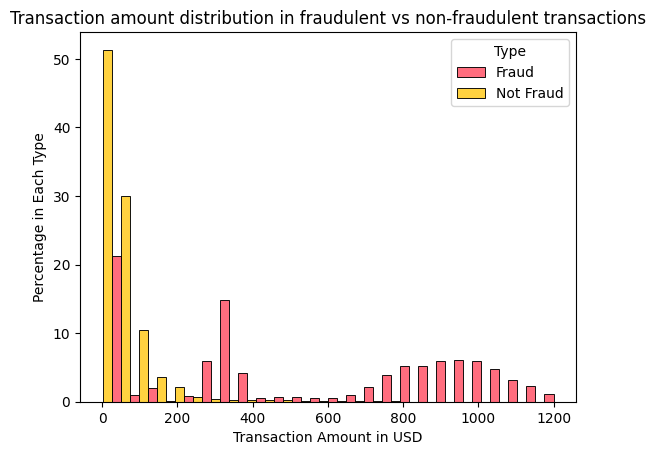

In [29]:
ax=sns.histplot(x='amt',data=df_complete_pd[df_complete_pd.amt<=1200],hue='is_fraud',stat='percent',multiple='dodge',common_norm=False,bins=25, palette=colors)

ax.set_ylabel('Percentage in Each Type')
ax.set_xlabel('Transaction Amount in USD')

plt.title('Transaction amount distribution in fraudulent vs non-fraudulent transactions')
plt.legend(title='Type', labels=['Fraud', 'Not Fraud'])

1. Faixa Baixa (< 200 USD):
   - As barras amarelas ("Not Fraud") mostram que a maioria das transações legítimas está concentrada em valores muito baixos, especialmente transações abaixo de 50 USD.
   - No entanto, a densidade de fraudes em valores baixos (vermelho) também é significativa, mostrando uma sobreposição.
2. Faixa Média (200–600 USD):
   - Nesta faixa, a proporção de fraudes começa a superar a de transações legítimas em várias categorias de valor.
   - Reflete que fraudes podem ser mais comuns em transações de valor médio (acima de 200 USD, mas não extremamente altas).
3. Faixa Alta (> 600 USD):
   - Fraudes continuam presentes em valores altos, mas a proporção de transações legítimas diminui substancialmente.
   - Esse padrão sugere que transações legítimas de valor elevado são raras no dataset.

<ipython-input-30-4e031cc75d0f>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_complete_pd['amt'],fit = norm, color = colors[0])


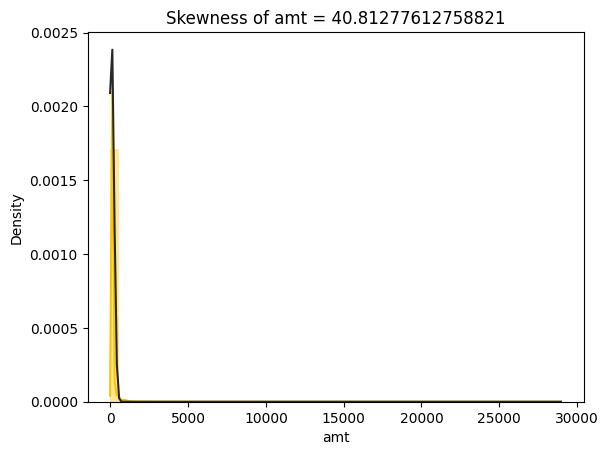

In [30]:
plt.rcParams.update({'font.size': 10})
skewness = str(skew(df_complete_pd['amt']))
sns.distplot(df_complete_pd['amt'],fit = norm, color = colors[0])
plt.title("Skewness of amt"+" = "+skewness)
plt.show()

In [31]:
# Adicionar transformação logarítmica para lidar com cauda longa
df_complete_pd["log_amt"] = np.log1p(df_complete_pd["amt"])  # Transformação logarítmica

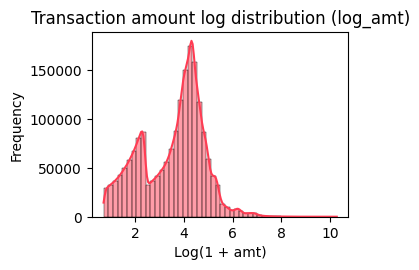

In [32]:
# Histograma de `log_amt` (transformado logarítmico)
plt.subplot(2, 2, 2)
sns.histplot(
    data=df_complete_pd, x="log_amt", bins=50, kde=True, color=colors[1]
)
plt.title("Transaction amount log distribution (log_amt)")
plt.xlabel("Log(1 + amt)")
plt.ylabel("Frequency")
plt.tight_layout()

#### 1.2. Estatísticas de fraude por merchant

In [33]:
# Quantidade de merchants distintos
df_complete_pd["merchant"].nunique()

693

In [34]:
# Calcular o valor total de transações (amt) por merchant
total_por_merchant = df_complete.groupBy("merchant").agg(
    sum(col("amt")).alias("total_amt"),
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contar fraudes por merchant
    count("*").alias("total_count")  # Total de transações por merchant
)

# Calcular a porcentagem de fraude por merchant
total_por_merchant = total_por_merchant.withColumn(
    "percent_fraud", (col("fraude_count") / col("total_count")) * 100
)

# Selecionar os 10 maiores merchants por valor total de transações
top_10_merchants = total_por_merchant.orderBy(col("total_amt").desc()).limit(10)

# Exibir os 10 maiores merchants junto com suas estatísticas de fraude
top_10_merchants.show(truncate=False)

+----------------------------------+------------------+------------+-----------+------------------+
|merchant                          |total_amt         |fraude_count|total_count|percent_fraud     |
+----------------------------------+------------------+------------+-----------+------------------+
|fraud_Kilback LLC                 |557058.6200000005 |62          |6262       |0.9900990099009901|
|fraud_Pacocha-O'Reilly            |424090.3599999999 |44          |3650       |1.2054794520547945|
|fraud_Murray-Smitham              |422671.80000000034|51          |3603       |1.4154870940882598|
|fraud_Goodwin-Nitzsche            |422158.80000000005|42          |3598       |1.1673151750972763|
|fraud_Hackett-Lueilwitz           |420749.8699999999 |38          |3626       |1.0479867622724766|
|fraud_Rau and Sons                |419981.1400000001 |60          |3546       |1.6920473773265652|
|fraud_Bauch-Raynor                |418878.2400000001 |41          |3597       |1.1398387545176536|


Os 10 maiores merchants em valor de transações se destacam em % de transações fraudulentas em relação ao restante do dataset.

In [35]:
# Calcular o percentual de fraudes e não fraudes para cada merchant
merchant_fraud = df_complete_pd.groupby(['merchant', 'is_fraud']).size().reset_index(name="count")

# Normalizar para obter proporções (100%)
merchant_fraud['percent'] = merchant_fraud.groupby('merchant')['count'].transform(lambda x: (x / x.sum()) * 100)

# Selecionar os 10 principais merchants com maior volume de fraudes
top_10_merchants = merchant_fraud[merchant_fraud['is_fraud'] == 1].sort_values('count', ascending=False).head(10)

<ipython-input-36-ff2350353f00>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-36-ff2350353f00>:3: UserWarning: The palette list has more values (12) than needed (10), which may not be intended.
  sns.barplot(


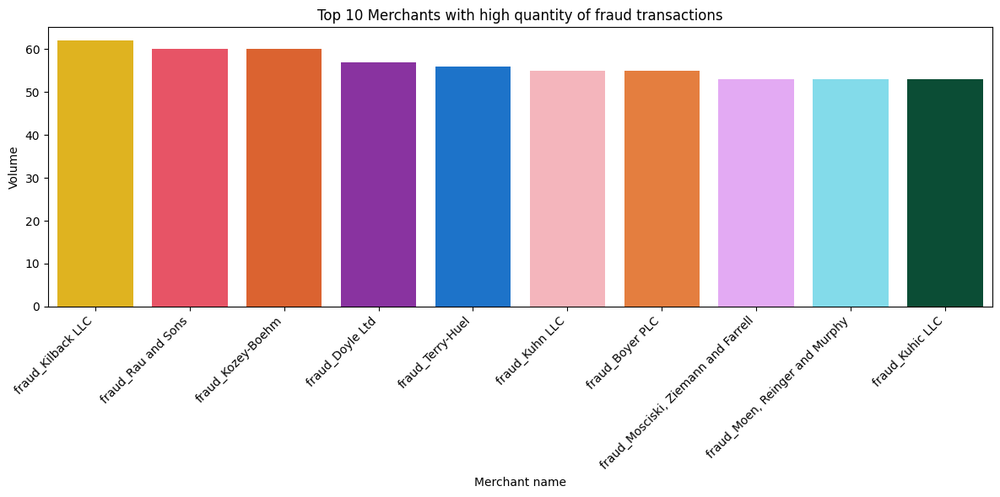

In [36]:
# Gráfico: Top 10 Merchants com Maior Fraude
plt.figure(figsize=(12, 6))
sns.barplot(
    data=top_10_merchants,
    x="merchant", y="count", palette=colors
)
plt.xticks(rotation=45, ha="right")
plt.title("Top 10 Merchants with high quantity of fraud transactions")
plt.ylabel("Volume")
plt.xlabel("Merchant name")
plt.tight_layout()
plt.show()

In [37]:
# Calcular o valor total de transações (amt) e fraudes por merchant
total_por_merchant = df_complete.groupBy("merchant").agg(
    sum("amt").alias("total_amt"),  # Soma total de transações
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_amt"),  # Soma de valores fraudulentos
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contar fraudes por merchant
    count("*").alias("total_count")  # Total de transações por merchant
)

# Calcular a porcentagem das fraudes em valor (fraude_amt / total_amt)
total_por_merchant = total_por_merchant.withColumn(
    "percent_fraud_amt", (col("fraude_amt") / col("total_amt")) * 100
).withColumn(
    "percent_fraud_count", (col("fraude_count") / col("total_count")) * 100  # Porcentagem de fraudes por quantidade
)

# Selecionar os 20 maiores merchants por valor total de fraudes (fraude_amt)
top_20_merchants_by_fraude_amt = total_por_merchant.orderBy(col("fraude_amt").desc()).limit(20)

# Exibir os 20 maiores merchants por fraude e suas estatísticas
top_20_merchants_by_fraude_amt.show(truncate=False)

+------------------------------------------+------------------+------------------+------------+-----------+------------------+-------------------+
|merchant                                  |total_amt         |fraude_amt        |fraude_count|total_count|percent_fraud_amt |percent_fraud_count|
+------------------------------------------+------------------+------------------+------------+-----------+------------------+-------------------+
|fraud_Kozey-Boehm                         |249963.41999999998|60410.62          |60          |2758       |24.167784230188563|2.1754894851341553 |
|fraud_Terry-Huel                          |269203.22000000003|55203.840000000004|56          |2864       |20.506381758732307|1.9553072625698324 |
|fraud_Kuhic LLC                           |256287.37         |54282.85999999999 |53          |2842       |21.18046628673118 |1.864883884588318  |
|fraud_Mosciski, Ziemann and Farrell       |247339.8599999999 |52948.65          |53          |2821       |21.40724507

Existem merchants com alta concentração do valor transacionado como fraude também.

In [38]:
# Filtrar apenas transações fraudulentas
dados_fraude = df_complete.filter(col("is_fraud") == 1)

# Aglutinar os valores por 'lat' e 'long' somando 'amt'
dados_fraude_merchant_agregado = dados_fraude.groupBy("merch_lat", "merch_long").agg(
    sum("amt").alias("total_amt")
)

# Converter o DataFrame PySpark para Pandas
dados_fraude_merchant_pd = dados_fraude_merchant_agregado.toPandas()

# Criar o mapa inicial centralizado na coordenada média
mapa_fraude_merchant = folium.Map(
    location=[dados_fraude_merchant_pd["merch_lat"].mean(), dados_fraude_merchant_pd["merch_long"].mean()],
    zoom_start=6
)

# Adicionar os pontos agregados ao mapa
for _, row in dados_fraude_merchant_pd.iterrows():
    folium.Circle(
        location=[row["merch_lat"], row["merch_long"]],
        radius=row["total_amt"] * 10,  # Controle do tamanho proporcional ao valor total
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.6,
        tooltip=f"Valor Total: ${row['total_amt']:.2f}"
    ).add_to(mapa_fraude_merchant)

# Salvar o mapa como HTML
mapa_fraude_merchant.save("mapa_fraude_merchant.html")

print("O mapa foi gerado e salvo como 'mapa_fraude_merchant.html'")

O mapa foi gerado e salvo como 'mapa_fraude_merchant.html'


In [39]:
# Exibir o mapa no próprio notebook
mapa_fraude_merchant

Maior concentração de fraude em merchants ao leste dos EUA.

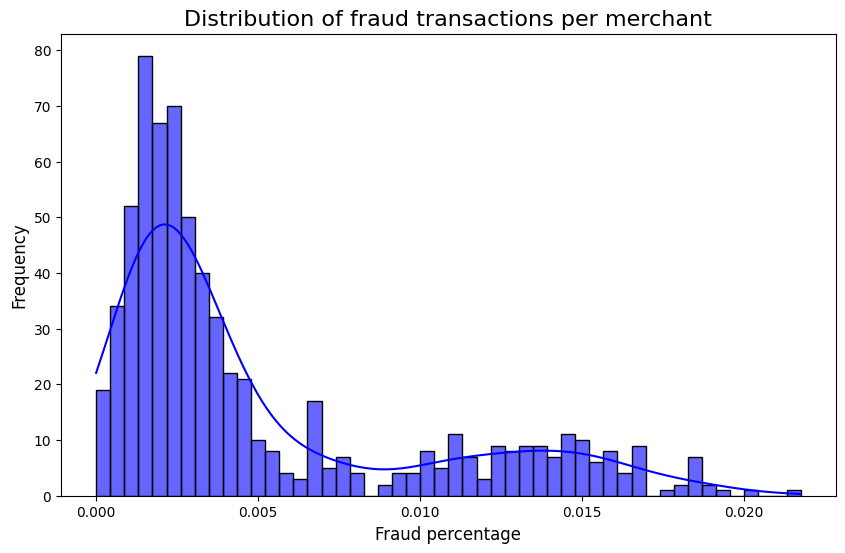

In [40]:
# Agrupar por 'merchant' e calcule o percentual de fraudes
fraud_distribution = (
    df_complete_pd.groupby('merchant')['is_fraud']
    .mean()  # Para cada merchant, calcula a média dos valores de fraude (percentual de registros fraudulentos)
    .reset_index()  # Restaura o índice
    .rename(columns={'is_fraud': 'merchant_fraud_percentage'})  # Nomeia a nova coluna calculada
)


# Estudar toda a distribuição dos percentuais
plt.figure(figsize=(10, 6))
sns.histplot(fraud_distribution['merchant_fraud_percentage'], bins=50, kde=True, color='blue', alpha=0.6)
plt.title('Distribution of fraud transactions per merchant', fontsize=16)
plt.xlabel('Fraud percentage', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.show()

1. Predominância de Merchants com Percentuais Baixos de Fraude:
   A maior parte dos merchants possui um percentual de fraude próximo a 0%, indicando que a maioria das transações realizadas é legítima.
2. Cauda Longa:
   Há uma cauda longa na distribuição, com poucos merchants alcançando percentuais mais altos de fraude (acima de 1%). Esses merchants podem ser associados a atividades mais suspeitas e devem receber atenção especial.

In [41]:
# Adicionando a coluna fraud_percentage ao df_complete_pd
df_complete_pd = df_complete_pd.merge(
    fraud_distribution,  # Dataframe com o cálculo do percentual de fraude por merchant
    on='merchant',  # Merge baseado na coluna 'merchant'
    how='left'  # Mantém o df_complete_pd original e adiciona a nova coluna
)

# Verificando o resultado
df_complete_pd.head()

,_c0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,trans_num,unix_time,merch_lat,merch_long,is_fraud,year_trnsc,hour_trnsc,age,log_amt,merchant_fraud_percentage
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,2012,0,24,1.786747,0.013575
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,2012,0,34,4.684259,0.009921
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,2012,0,50,5.398660,0.001893
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,2012,0,45,3.828641,0.002416
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,2012,0,26,3.760269,0.003057


### 1.3 Estatísticas de fraude por gênero

In [42]:
# Calcular o total geral de registros no dataset
total_geral = df_complete.count()

# Distribuição geral de gêneros com porcentagem
distribuicao_genero = df_complete.groupBy("gender").agg(
    count("*").alias("total_count")  # Contagem total por gênero
).withColumn(
    "percent", (col("total_count") / total_geral) * 100  # Calcular porcentagem
)

# Mostrar a nova tabela com porcentagem
distribuicao_genero.show()

+------+-----------+-----------------+
|gender|total_count|          percent|
+------+-----------+-----------------+
|     F|    1014749|54.78040848761117|
|     M|     837645|45.21959151238883|
+------+-----------+-----------------+



In [43]:
# Calcular a contagem total e de fraudes por gênero
distribuicao_fraude_genero = df_complete.groupBy("gender").agg(
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contar fraudes (is_fraud = 1)
    count("*").alias("total_count")  # Contagem total por gênero
).withColumn(
    "percent_fraud", (col("fraude_count") / col("total_count")) * 100  # Calcular porcentagem de fraudes
)

# Mostrar os resultados
distribuicao_fraude_genero.show()

+------+------------+-----------+------------------+
|gender|fraude_count|total_count|     percent_fraud|
+------+------------+-----------+------------------+
|     F|        4899|    1014749|0.4827794853702739|
|     M|        4752|     837645|0.5673047651451391|
+------+------------+-----------+------------------+



Existe uma concentração maior de fraudadores homens que mulheres.

<ipython-input-44-168b34302b9a>:11: UserWarning: The palette list has more values (12) than needed (2), which may not be intended.
  ax = sns.barplot(


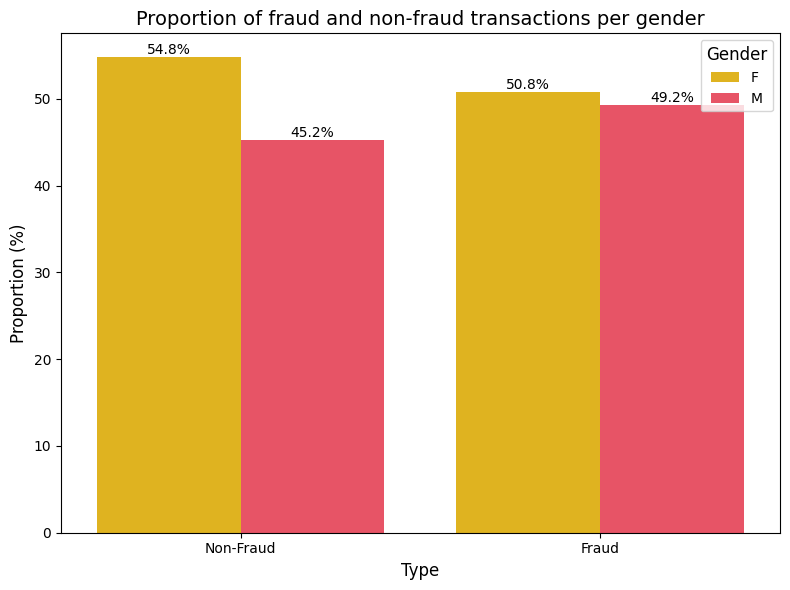

In [44]:
# Contar fraudes e não fraudes por gênero
gender_fraud = df_complete_pd.groupby(["gender", "is_fraud"]).size().reset_index(name="count")

# Calcular percentuais para converter em gráfico 100%
gender_fraud["percent"] = gender_fraud.groupby("is_fraud")["count"].transform(lambda x: (x / x.sum()) * 100)

# Gráfico de barras empilhadas com `is_fraud` no eixo X
plt.figure(figsize=(8, 6))  # Ajustar o tamanho do gráfico

# Criar o barplot segmentado com `hue="gender"`
ax = sns.barplot(
    data=gender_fraud,
    x="is_fraud",  # Diferenciação entre fraudes e não fraudes no eixo X
    y="percent",   # Percentuais no eixo Y
    hue="gender",  # Gêneros como categorias diferenciadas
    palette=colors  # Paleta definida para visibilidade
)

# Ajustar rótulos dos eixos e título
ax.set_ylabel("Proportion (%)", fontsize=12)  # Rótulo do eixo Y
ax.set_xlabel("Type", fontsize=12)  # Rótulo do eixo X
ax.set_title("Proportion of fraud and non-fraud transactions per gender", fontsize=14)  # Título do gráfico
ax.set_xticks([0, 1])  # Garantir que apenas dois rótulos apareçam (fraude e não fraude)
ax.set_xticklabels(["Non-Fraud", "Fraud"])  # Nomear as categorias no eixo X

# Adicionar rótulos de valores nas barras (percentuais)
for bars in ax.containers:
    ax.bar_label(bars, fmt="%.1f%%", fontsize=10, label_type="edge")  # Colocar os valores no topo das barras

# Ajustar a legenda
plt.legend(
    title="Gender",  # Título da legenda
    loc="upper right",  # Posicionar no canto superior direito
    fontsize=10,       # Tamanho do texto
    title_fontsize=12  # Título em fonte maior
)

# Ajustar o layout para evitar cortes de texto
plt.tight_layout()

# Exibir o gráfico
plt.show()

### 1.4. Estatísticas de fraude por idade

In [45]:
# Criar faixas etárias
df_complete = df_complete.withColumn(
    "faixa_etaria",
    when(col("age") < 18, "Menores de 18")
    .when((col("age") >= 18) & (col("age") <= 25), "18-25")
    .when((col("age") >= 26) & (col("age") <= 35), "26-35")
    .when((col("age") >= 36) & (col("age") <= 50), "36-50")
    .when((col("age") >= 51) & (col("age") <= 65), "51-65")
    .otherwise("65+")
)

# Agrupar por faixa etária e calcular fraudes
fraude_por_faixa_etaria = df_complete.groupBy("faixa_etaria").agg(
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contagem de fraudes
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_total_amt"),  # Soma de valores fraudulentos
    count("*").alias("total_count"),  # Total de transações por faixa etária
    sum("amt").alias("total_amt")  # Soma de valores totais por faixa etária
).withColumn(
    "percent_fraud", (col("fraude_count") / col("total_count")) * 100  # Porcentagem de transações fraudulentas
)

# Ordenar os resultados pelas faixas etárias
fraude_por_faixa_etaria = fraude_por_faixa_etaria.orderBy("faixa_etaria")

# Ver os resultados
fraude_por_faixa_etaria.show(truncate=False)

+-------------+------------+------------------+-----------+--------------------+-------------------+
|faixa_etaria |fraude_count|fraude_total_amt  |total_count|total_amt           |percent_fraud      |
+-------------+------------+------------------+-----------+--------------------+-------------------+
|18-25        |1305        |656096.1099999998 |293052     |2.155609118999999E7 |0.44531345972728387|
|26-35        |1614        |784786.1399999999 |401979     |3.0361087270000078E7|0.4015135118998754 |
|36-50        |2831        |1443843.4400000002|546738     |3.8213465149999864E7|0.5177982872966576 |
|51-65        |1804        |1048040.8200000001|288235     |1.897410964000008E7 |0.6258781896716221 |
|65+          |1224        |674195.5099999998 |167964     |1.1148617179999998E7|0.7287275844823891 |
|Menores de 18|873         |514451.26999999984|154426     |9531961.579999974   |0.5653193115149003 |
+-------------+------------+------------------+-----------+--------------------+-----------

Existe maior concentração de fraudadores em idades mais avançadas.

<ipython-input-46-704128595eaa>:1: UserWarning: The palette list has more values (12) than needed (2), which may not be intended.
  ax=sns.kdeplot(x='age',data=df_complete_pd, hue='is_fraud', common_norm=False, palette=colors)


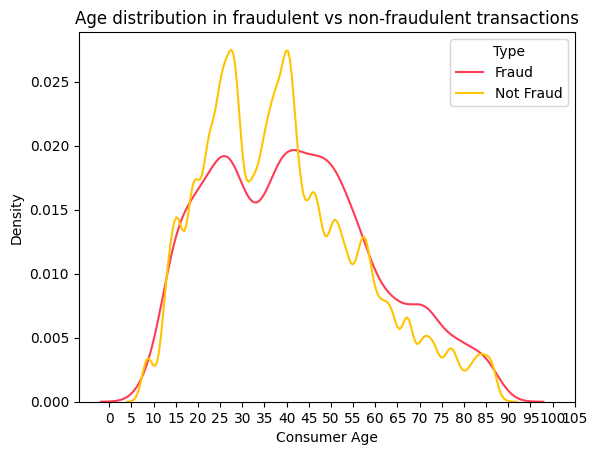

In [46]:
ax=sns.kdeplot(x='age',data=df_complete_pd, hue='is_fraud', common_norm=False, palette=colors)
ax.set_xlabel('Consumer Age')
ax.set_ylabel('Density')
plt.xticks(np.arange(0,110,5))
plt.title('Age distribution in fraudulent vs non-fraudulent transactions')
plt.legend(title='Type', labels=['Fraud', 'Not Fraud'])

1. Fraudes Aumentam com Idade Mediana:
   - Fraudes são mais comuns para consumidores de idade mediana (30–50 anos).
   - Isso pode ocorrer porque pessoas nessa faixa etária costumam realizar transações de maior valor ou em maior volume.
2. Pico de Transações Legítimas em Jovens:
   - Transações legítimas atingem o pico em consumidores de 20–35 anos, sugerindo que jovens são responsáveis pela maior parte das transações não fraudulentas.
3. Idade Avançada (60+):
   - A densidade decai fortemente para ambos os grupos acima dos 60 anos, o que pode ser explicado por uma menor frequência de transações em consumidores mais velhos.

**É possível perceber que, a partir dos 40 anos, a curva de densidade de transações fraudulentas é superior a de não-fraudulentas.**



### 1.5. Estatísticas de fraude por região

In [47]:
print(f"Volume of states: {df_complete_pd['state'].nunique()}")
print(f"Volume of cities: {df_complete_pd['city'].nunique()}")

Volume of states: 51
Volume of cities: 906


In [48]:
# Calcular a soma de `amt` total e fraudes por estado (`state`)
fraude_por_state = df_complete.groupBy("state").agg(
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_amt"),  # Soma de `amt` para fraudes (is_fraud = 1)
    sum("amt").alias("total_amt")  # Soma total de `amt` por estado
).withColumn(
    "percent_fraud_amt", (col("fraude_amt") / col("total_amt")) * 100  # Porcentagem de fraude em valores monetários
)

# Mostrar os resultados ordenados pela porcentagem de fraudes em ordem decrescente
fraude_por_state.orderBy(col("percent_fraud_amt").desc()).show(truncate=False)

+-----+------------------+------------------+------------------+
|state|fraude_amt        |total_amt         |percent_fraud_amt |
+-----+------------------+------------------+------------------+
|DE   |4630.44           |4630.44           |100.0             |
|RI   |10994.759999999998|52397.589999999975|20.98333148528397 |
|AK   |30219.890000000007|210694.99000000002|14.342956137685098|
|OR   |103019.63         |1839620.590000003 |5.600047670699306 |
|NV   |24793.480000000003|448077.6199999996 |5.533300234901271 |
|NH   |47692.990000000005|889689.9499999994 |5.360630408379913 |
|NE   |119493.07         |2269986.0700000036|5.264044197416587 |
|ME   |74910.7           |1482788.1400000006|5.052016399321886 |
|NM   |70597.20000000001 |1434807.760000002 |4.920324657290668 |
|VA   |143557.76         |2936867.7999999956|4.888124688486156 |
|MN   |148534.90000000002|3159913.4500000053|4.700600264858513 |
|HI   |10091.51          |215843.28000000006|4.675387623835219 |
|MS   |94575.58          

Delaware só teve transações fraudulentas no período. Alguns outros estados, como Rhode Island e Alasca possuem alta concentração de valor transacionado como fraude.

In [49]:
# Filtrar apenas fraudes
frauds_only = df_complete_pd[df_complete_pd["is_fraud"] == 1]

# Agrupar fraudes por estado e somar o valor das transações fraudulentas
state_fraud_amt = (
    frauds_only.groupby("state")["amt"]
    .sum()
    .reset_index()
    .rename(columns={"amt": "fraud_amt"})  # Renomear para clareza
)

# Mapear valores fraudulentos por estado
fig = px.choropleth(
    state_fraud_amt,
    locations="state",
    locationmode="USA-states",  # Configuração para estados dos EUA
    color="fraud_amt",
    hover_name="state",
    color_continuous_scale="Reds",
    title="Fraud amount per State (USD)"
)

fig.show()

Quando olhamos para valor total transacionado que é fraude, Nova Iorque, Pensilvânia e Texas se destacam em relação aos demais.

In [50]:
# Calcular a soma de `amt` total e fraudes por cidade (city) e estado (state)
fraude_city_state = df_complete.groupBy("city", "state").agg(
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_amt"),  # Soma de `amt` para fraudes (is_fraud = 1)
    sum("amt").alias("total_amt")  # Soma total de `amt`
).withColumn(
    "percent_fraud_amt", (col("fraude_amt") / col("total_amt")) * 100  # Porcentagem de fraude em valores monetários
)

# Mostrar os resultados ordenados pela porcentagem de fraudes em ordem decrescente
fraude_city_state.orderBy(col("percent_fraud_amt").desc()).show(truncate=False)

+--------------+-----+------------------+------------------+-----------------+
|city          |state|fraude_amt        |total_amt         |percent_fraud_amt|
+--------------+-----+------------------+------------------+-----------------+
|Gaines        |MI   |4831.610000000001 |4831.610000000001 |100.0            |
|Granbury      |TX   |8350.56           |8350.56           |100.0            |
|Downey        |CA   |5858.01           |5858.01           |100.0            |
|Walkertown    |NC   |5113.92           |5113.92           |100.0            |
|Morven        |NC   |4715.7300000000005|4715.7300000000005|100.0            |
|Waukau        |WI   |4693.06           |4693.06           |100.0            |
|Coulee Dam    |WA   |6467.8099999999995|6467.8099999999995|100.0            |
|Beacon        |NY   |6462.6            |6462.6            |100.0            |
|Claypool      |IN   |5671.95           |5671.95           |100.0            |
|Clinton       |IN   |8131.430000000001 |8131.430000

Existem cidades de baixos valores totais transacionados, mas que 100% das transações foram fraude também.

In [51]:
# Aglutinar os valores por 'lat' e 'long' somando 'amt'
dados_fraude_trnsc_agregado = dados_fraude.groupBy("lat", "long").agg(
    sum("amt").alias("total_amt")
)

# Converter o DataFrame PySpark para Pandas
dados_fraude_trnsc_pd = dados_fraude_trnsc_agregado.toPandas()

# Criar o mapa inicial centralizado na coordenada média
mapa_fraude_trnsc = folium.Map(
    location=[dados_fraude_trnsc_pd["lat"].mean(), dados_fraude_trnsc_pd["long"].mean()],
    zoom_start=6
)

# Adicionar os pontos agregados ao mapa
for _, row in dados_fraude_trnsc_pd.iterrows():
    folium.Circle(
        location=[row["lat"], row["long"]],
        radius=row["total_amt"] * 10,  # Controle do tamanho proporcional ao valor total
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.6,
        tooltip=f"Valor Total: ${row['total_amt']:.2f}"
    ).add_to(mapa_fraude_trnsc)

# Salvar o mapa como HTML
mapa_fraude_trnsc.save("mapa_fraude_trnsc.html")

print("O mapa foi gerado e salvo como 'mapa_fraude_trnsc.html'")

O mapa foi gerado e salvo como 'mapa_fraude_trnsc.html'


In [52]:
mapa_fraude_trnsc

Diferente do mapa que foi feito em cima da lat long do merchant, e olhando essa visão cliente, existe uma maior concentração dos valores transacionados. Existem muito mais localizações de merchants que sofrem fraude do que fraudadores que aplicam.

In [53]:
# Calcular o percentual de fraude da cidade
fraude_cidade = df_complete_pd.groupby('city')['is_fraud'].mean() * 100
df_complete_pd['city_fraud_rate'] = df_complete_pd['city'].map(fraude_cidade)

In [54]:
cidade_pop_media = (
    df_complete
    .select('city', 'city_pop')
    .distinct()
    .agg(
    mean("city_pop").alias("pop_media")
).orderBy(col("pop_media").desc())
)

cidade_pop_media.show(truncate=False)

+-----------------+
|pop_media        |
+-----------------+
|61727.54361702128|
+-----------------+



In [55]:
# Agrupar por cidade e população para calcular fraudes
fraude_cidade_pop = df_complete.groupBy("city", "city_pop").agg(
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_amt"),  # Valores fraudulentos
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contagem de fraudes
    count("*").alias("total_count")  # Total de transações
).withColumn(
    "percent_fraud", (col("fraude_count") / col("total_count")) * 100  # Percentual de transações fraudulentas
)

# Ordenar por população em ordem decrescente
fraude_cidade_pop = fraude_cidade_pop.orderBy(col("percent_fraud").desc())

# Exibir os resultados
fraude_cidade_pop.show(truncate=False)

+--------------+--------+------------------+------------+-----------+-------------+
|city          |city_pop|fraude_amt        |fraude_count|total_count|percent_fraud|
+--------------+--------+------------------+------------+-----------+-------------+
|Clinton       |10085   |8131.430000000001 |12          |12         |100.0        |
|Georgetown    |18799   |4630.44           |9           |9          |100.0        |
|Hubbell       |121     |8431.929999999998 |19          |19         |100.0        |
|Crouse        |2749    |3023.4000000000005|8           |8          |100.0        |
|Claypool      |3631    |5671.95           |7           |7          |100.0        |
|Ashland       |40470   |6149.41           |10          |10         |100.0        |
|Coulee Dam    |1439    |6467.8099999999995|15          |15         |100.0        |
|Granbury      |47119   |8350.56           |12          |12         |100.0        |
|Morven        |2801    |4715.7300000000005|8           |8          |100.0  

As cidades com maiores concentrações em fraude são pequenas, possuem menores populações médias que as demais cidades.

<ipython-input-56-58159b6b6f42>:1: UserWarning:

The palette list has more values (12) than needed (2), which may not be intended.



Text(0.5, 1.0, 'City population distribution in fraudulent vs non-fraudulent transactions')

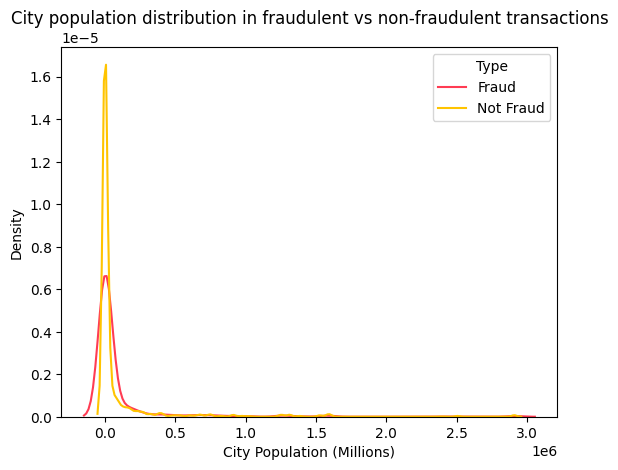

In [56]:
ax=sns.kdeplot(x='city_pop',data=df_complete_pd, hue='is_fraud', common_norm=False, palette=colors)
ax.set_xlabel('City Population (Millions)')
ax.set_ylabel('Density')
plt.legend(title='Type', labels=['Fraud', 'Not Fraud'])
plt.title('City population distribution in fraudulent vs non-fraudulent transactions')

<ipython-input-57-d25801048c90>:8: UserWarning:

The palette list has more values (12) than needed (2), which may not be intended.



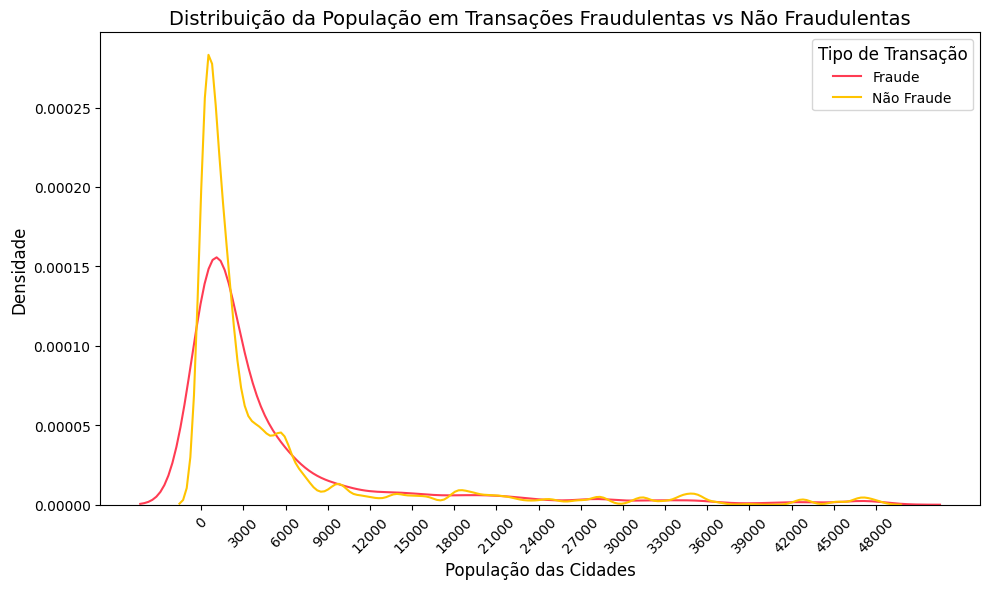

In [57]:
# Gráfico KDE Comparando City Population por Fraude
plt.figure(figsize=(10, 6))  # Ajustar o tamanho do gráfico

# Filtro para populações de até 50.000
filtered_data = df_complete_pd[df_complete_pd['city_pop'] <= 50000]

# Criar o gráfico KDE (Kernel Density Estimation)
ax = sns.kdeplot(
    x='city_pop',
    data=filtered_data,
    hue='is_fraud',
    common_norm=False,  # Evitar normalização conjunta
    palette=colors     # Aplicar paleta de cores
)

# Ajustar rótulos do eixo
ax.set_xlabel('População das Cidades', fontsize=12)  # Nomear eixo X
ax.set_ylabel('Densidade', fontsize=12)  # Nomear eixo Y

# Ajustar ticks no eixo X
plt.xticks(np.arange(0, 50001, 3000), fontsize=10, rotation=45)  # Marcar intervalos de 50.000

# Adicionar título ao gráfico
plt.title('Distribuição da População em Transações Fraudulentas vs Não Fraudulentas', fontsize=14)

# Ajustar a legenda
plt.legend(
    title='Tipo de Transação',
    labels=['Fraude', 'Não Fraude'],
    fontsize=10,
    title_fontsize=12,
    loc='upper right'  # Posicionar a legenda no canto superior direito
)

# Ajustar layout
plt.tight_layout()

# Exibir o gráfico
plt.show()

1. Fraudes em Cidades Menores:
   - A maior parte das fraudes ocorre em cidades com população baixa (até cerca de 10.000).
   - Isso pode indicar que:
     - Fraudadores preferem trabalhar em cidades pequenas onde a monitoração financeira pode ser menos rigorosa.
     - Cidades com menor infraestrutura digital podem ser mais vulneráveis a fraudes.
2. Forte Declínio para Cidades Maiores:
   - A densidade de fraudes se reduz consideravelmente em cidades maiores (acima de 20.000 habitantes).
   - Isso pode sugerir cidades maiores têm melhores monitoramentos e controles antifraude.
3. Diferença Entre Fraude e Não-Fraude:
   - Para populações pequenas (até 3.000 pessoas), fraudes e não fraudes têm densidades similares.
   - Para populações maiores, a densidade de não fraudes supera a de fraudes.

In [58]:
df_complete_pd["distance"] = df_complete_pd.apply(lambda row: haversine_distance(row['lat'], row['long'], row['merch_lat'], row['merch_long']), axis=1)

<ipython-input-59-3aa56b879a05>:1: UserWarning:

The palette list has more values (12) than needed (2), which may not be intended.



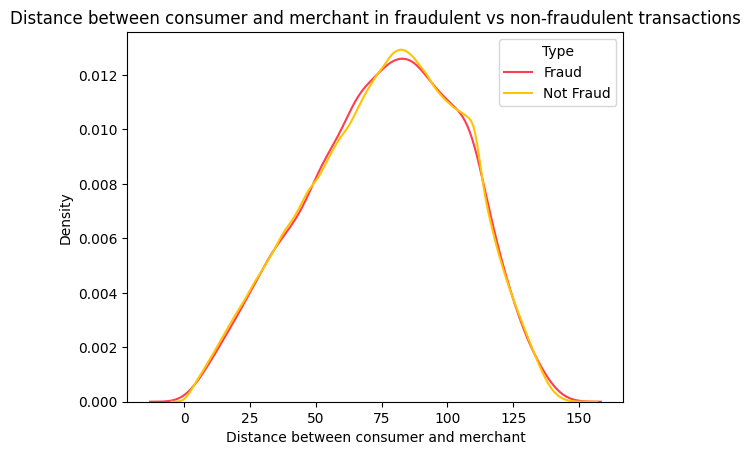

In [59]:
ax=sns.kdeplot(x='distance',data=df_complete_pd, hue='is_fraud', common_norm=False, palette=colors)
ax.set_xlabel('Distance between consumer and merchant')
ax.set_ylabel('Density')
#plt.xticks(np.arange(0,110,5))
plt.title('Distance between consumer and merchant in fraudulent vs non-fraudulent transactions')
plt.legend(title='Type', labels=['Fraud', 'Not Fraud'])

1. Sem Diferenças Significativas Entre Fraudes e Não-Fraudes:
   - As distribuições entre os dois grupos são praticamente sobrepostas.
   - Não há uma associação clara entre distância consumidor-comerciante e fraudes nesse dataset, com base na densidade.

In [60]:
# Dicionário para mapeamento de estados para regiões dos EUA
state_to_region = {
    "AL": "South", "AK": "West", "AZ": "West", "AR": "South", "CA": "West",
    "CO": "West", "CT": "Northeast", "DE": "Northeast", "FL": "South",
    "GA": "South", "HI": "West", "ID": "West", "IL": "Midwest", "IN": "Midwest",
    "IA": "Midwest", "KS": "Midwest", "KY": "South", "LA": "South", "ME": "Northeast",
    "MD": "Northeast", "MA": "Northeast", "MI": "Midwest", "MN": "Midwest",
    "MS": "South", "MO": "Midwest", "MT": "West", "NE": "Midwest", "NV": "West",
    "NH": "Northeast", "NJ": "Northeast", "NM": "West", "NY": "Northeast",
    "NC": "South", "ND": "Midwest", "OH": "Midwest", "OK": "South", "OR": "West",
    "PA": "Northeast", "RI": "Northeast", "SC": "South", "SD": "Midwest",
    "TN": "South", "TX": "South", "UT": "West", "VT": "Northeast",
    "VA": "South", "WA": "West", "WV": "South", "WI": "Midwest", "WY": "West"
}

# Criar uma nova coluna em `df_complete_pd` para a região
df_complete_pd["region"] = df_complete_pd["state"].map(state_to_region)

# Validar as contagens de fraudes por região
region_fraud_analysis = (
    df_complete_pd.groupby(["region", "is_fraud"])
    .size()
    .reset_index(name="count")
)

# Calcular proporções de fraudes por região
region_fraud_analysis["percent"] = region_fraud_analysis.groupby("region")["count"].transform(lambda x: (x / x.sum()) * 100)

# Exibir os dados
print(region_fraud_analysis)

      region  is_fraud   count    percent
0    Midwest         0  518437  99.469305
1    Midwest         1    2766   0.530695
2  Northeast         0  385217  99.453187
3  Northeast         1    2118   0.546813
4      South         0  660268  99.500289
5      South         1    3316   0.499711
6       West         0  273722  99.483903
7       West         1    1420   0.516097


<ipython-input-61-f88d4efc380f>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-61-f88d4efc380f>:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-61-f88d4efc380f>:13: UserWarning:

The palette list has more values (12) than needed (4), which may not be intended.



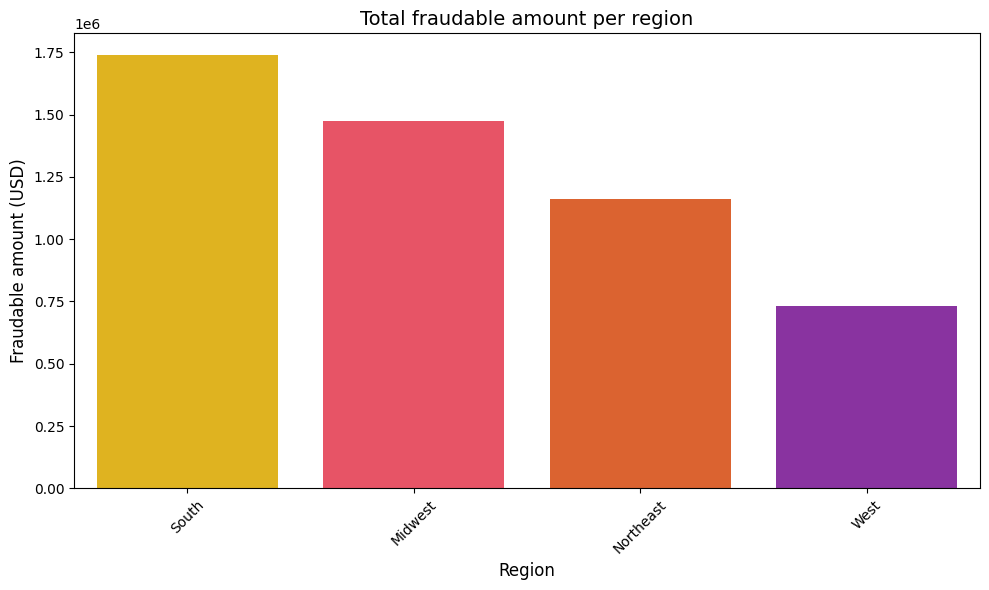

In [61]:
frauds_only["region"] = frauds_only["state"].map(state_to_region)

# Agrupar valores fraudulentos por região
region_fraud_amt = (
    frauds_only.groupby("region")["amt"]
    .sum()
    .reset_index()
    .rename(columns={"amt": "fraud_amt"})  # Renomear a coluna
)

# Gráfico de barras: Fraudes por região
plt.figure(figsize=(10, 6))
sns.barplot(
    data=region_fraud_amt.sort_values("fraud_amt", ascending=False),
    x="region",
    y="fraud_amt",
    palette=colors
)
plt.title("Total fraudable amount per region", fontsize=14)
plt.xlabel("Region", fontsize=12)
plt.ylabel("Fraudable amount (USD)", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<ipython-input-62-804e7c20dfec>:19: UserWarning:

The palette list has more values (12) than needed (4), which may not be intended.



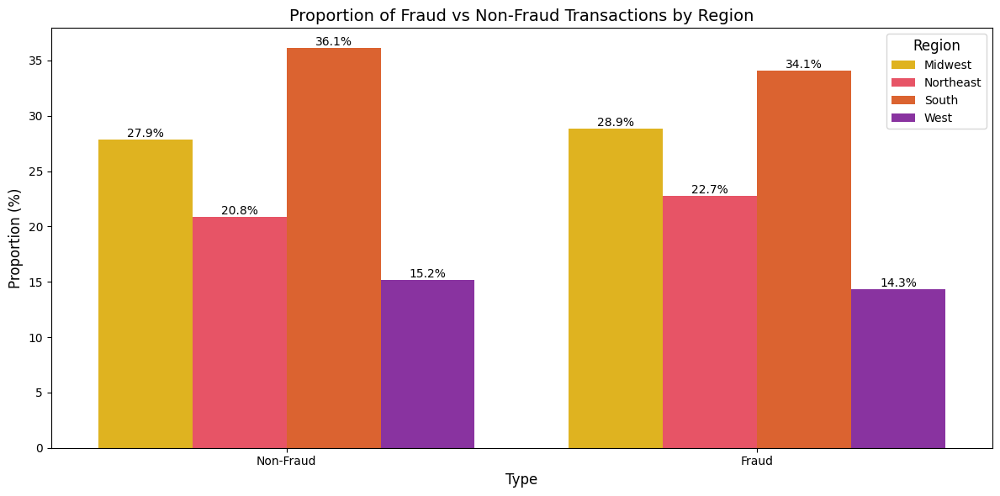

In [62]:
# Agrupar os valores por `region` e `is_fraud`
region_fraud = (
    df_complete_pd.groupby(["region", "is_fraud"])["amt"]
    .sum()
    .reset_index()
    .rename(columns={"amt": "total_amt"})  # Renomear coluna para clareza
)

# Calcular os percentuais em cada grupo de `is_fraud`
region_fraud["percent"] = (
    region_fraud.groupby("is_fraud")["total_amt"]
    .transform(lambda x: (x / x.sum()) * 100)
)

# Configurar o gráfico
plt.figure(figsize=(12, 6))  # Tamanho ajustado do gráfico

# Criar barras empilhadas para as regiões
ax = sns.barplot(
    data=region_fraud,
    x="is_fraud",  # Fraude (1 ou 0) no eixo X
    y="percent",   # Percentual no eixo Y
    hue="region",  # Regiões representadas por cores diferentes
    palette=colors  # Paleta
)

# Ajustar rótulos e título
ax.set_ylabel("Proportion (%)", fontsize=12)  # Rótulo do eixo Y
ax.set_xlabel("Type", fontsize=12)  # Rótulo do eixo X
ax.set_title("Proportion of Fraud vs Non-Fraud Transactions by Region", fontsize=14)  # Título do gráfico
ax.set_xticks([0, 1])  # Garantir que as categorias aparecem corretamente
ax.set_xticklabels(["Non-Fraud", "Fraud"])  # Especificar os rótulos (categorias)

# Adicionar rótulos diretamente nas barras
for bars in ax.containers:
    ax.bar_label(bars, fmt="%.1f%%", fontsize=10, label_type="edge")  # Valores diretamente no topo das barras

# Ajustar a legenda
plt.legend(
    title="Region",  # Título claro para a legenda
    loc="upper right",  # Localização no canto superior direito
    fontsize=10,        # Tamanho do texto
    title_fontsize=12   # Título maior para destaque
)

# Ajustar layout para evitar cortes ou sobreposições
plt.tight_layout()

# Exibir o gráfico
plt.show()

O centro-oeste e o nordeste possuem maior concentração de fraude do que as outras regiões.

### 1.6. Estatísticas de fraude por cartão de crédito

In [63]:
print(f"Volume of credit cards: {df_complete_pd['cc_num'].nunique()}")

Volume of credit cards: 999


In [64]:
# Agrupar por número do cartão e calcular para fraudes
fraude_por_cc_num = df_complete.groupBy("cc_num").agg(
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_amt"),  # Soma de valores fraudulentos
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contagem de fraudes
    count("*").alias("total_count")  # Total de transações por cartão (fraude + não fraude)
).withColumn(
    "percent_fraud", (col("fraude_count") / col("total_count")) * 100  # Porcentagem de fraudes no total de transações
)

# Ordenar pelos valores fraudulentos em ordem decrescente
fraude_por_cc_num = fraude_por_cc_num.orderBy(col("percent_fraud").desc())

# Exibir os resultados
fraude_por_cc_num.show(truncate=False)

+-------------------+------------------+------------+-----------+-------------+
|cc_num             |fraude_amt        |fraude_count|total_count|percent_fraud|
+-------------------+------------------+------------+-----------+-------------+
|5144043920225212   |7068.08           |10          |10         |100.0        |
|3554421171166228   |1348.5299999999997|8           |8          |100.0        |
|4669558618943766   |7323.65           |10          |10         |100.0        |
|577891228931       |8789.74           |12          |12         |100.0        |
|4243521033756702612|4944.02           |9           |9          |100.0        |
|4714017207228610634|4900.65           |7           |7          |100.0        |
|38817501916673     |3023.4000000000005|8           |8          |100.0        |
|340187018810220    |1496.1            |7           |7          |100.0        |
|5301645381939419   |4175.17           |11          |11         |100.0        |
|3545578418030657   |3595.25           |

Também existe concentração de fraude por cartão, com alguns sendo usados apenas para transações fraudulentas.

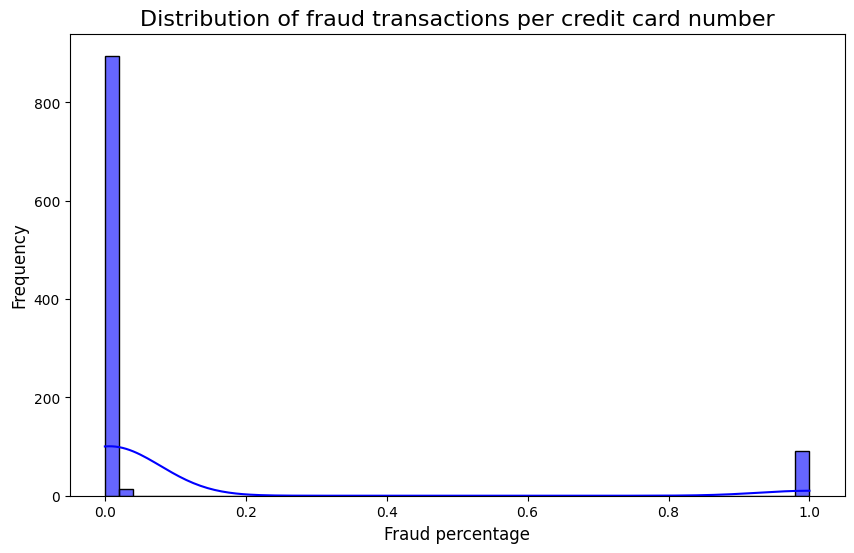

In [65]:
# Agrupar por 'cc_num' e calcule o percentual de fraudes
fraud_distribution = (
    df_complete_pd.groupby('cc_num')['is_fraud']
    .mean()  # Para cada cc_num, calcula a média dos valores de fraude (percentual de registros fraudulentos)
    .reset_index()  # Restaura o índice
    .rename(columns={'is_fraud': 'cc_num_fraud_percentage'})  # Nomeia a nova coluna calculada
)


# Estudar toda a distribuição dos percentuais
plt.figure(figsize=(10, 6))
sns.histplot(fraud_distribution['cc_num_fraud_percentage'], bins=50, kde=True, color='blue', alpha=0.6)
plt.title('Distribution of fraud transactions per credit card number', fontsize=16)
plt.xlabel('Fraud percentage', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.show()

In [66]:
# Adicionando a coluna cc_num_fraud_percentage ao df_complete_pd
df_complete_pd = df_complete_pd.merge(
    fraud_distribution,  # Dataframe com o cálculo do percentual de fraude por merchant
    on='cc_num',  # Merge baseado na coluna 'cc_num'
    how='left'  # Mantém o df_complete_pd original e adiciona a nova coluna
)

# Verificando o resultado
df_complete_pd.head()

,_c0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,is_fraud,year_trnsc,hour_trnsc,age,log_amt,merchant_fraud_percentage,city_fraud_rate,distance,region,cc_num_fraud_percentage
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,0,2012,0,24,1.786747,0.013575,0.375811,78.597568,South,0.003758
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,0,2012,0,34,4.684259,0.009921,0.215983,30.212176,West,0.001605
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,0,2012,0,50,5.398660,0.001893,1.088435,108.206083,West,0.010884
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,0,2012,0,45,3.828641,0.002416,2.018843,95.673231,West,0.020188
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,0,2012,0,26,3.760269,0.003057,0.444901,77.556744,South,0.004449


### 1.7. Estatísticas de fraude por categoria

In [67]:
# Agrupar por 'category' e calcular para fraudes
fraude_por_categoria = df_complete.groupBy("category").agg(
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_amt"),  # Soma de valores fraudulentos
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contagem de fraudes
    count("*").alias("total_count")  # Total de transações por categoria
).withColumn(
    "percent_fraud", (col("fraude_count") / col("total_count")) * 100  # Porcentagem de fraudes
)

# Ordenar pelos valores fraudulentos em ordem decrescente
fraude_por_categoria = fraude_por_categoria.orderBy(col("percent_fraud").desc())

# Exibir os resultados
fraude_por_categoria.show(truncate=False)

+--------------+------------------+------------+-----------+-------------------+
|category      |fraude_amt        |fraude_count|total_count|percent_fraud      |
+--------------+------------------+------------+-----------+-------------------+
|shopping_net  |2214847.6399999983|2219        |139322     |1.5927132828986088 |
|misc_net      |944009.7099999998 |1182        |90654      |1.3038586273082269 |
|grocery_pos   |695664.6199999999 |2228        |176191     |1.264536781106867  |
|shopping_pos  |928132.3399999999 |1056        |166463     |0.6343752065023459 |
|gas_transport |9442.529999999997 |772         |188029     |0.4105749645001569 |
|misc_pos      |68494.83999999998 |322         |114229     |0.28188988785684893|
|grocery_net   |2108.21           |175         |64878      |0.2697370449150714 |
|travel        |1399.4700000000003|156         |57956      |0.26916971495617364|
|personal_care |7571.96           |290         |130085     |0.22293116039512625|
|entertainment |147399.96000

As categorias mais fraudadas são shopping, misc e groceries, principalmente online.

<ipython-input-68-929b95eae581>:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-68-929b95eae581>:17: UserWarning:


The palette list has fewer values (12) than needed (14) and will cycle, which may produce an uninterpretable plot.



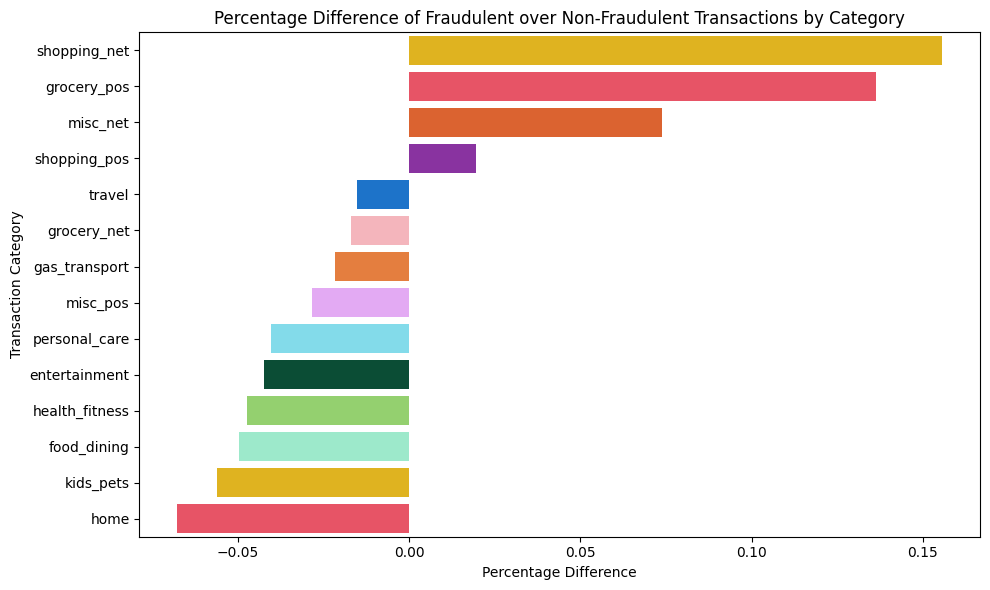

In [68]:
# Calcular a porcentagem de transações não fraudulentas por categoria
a = df_complete_pd[df_complete_pd['is_fraud'] == 0]['category'].value_counts(normalize=True).to_frame().reset_index()
a.columns = ['category', 'not fraud percentage']  # Renomear colunas para clareza

# Calcular a porcentagem de transações fraudulentas por categoria
b = df_complete_pd[df_complete_pd['is_fraud'] == 1]['category'].value_counts(normalize=True).to_frame().reset_index()
b.columns = ['category', 'fraud percentage']  # Renomear colunas para clareza

# Mesclar os dois DataFrames baseando-se na coluna 'category'
ab = a.merge(b, on='category')

# Calcular a diferença percentual entre fraudulentas e não fraudulentas para cada categoria
ab['diff'] = ab['fraud percentage'] - ab['not fraud percentage']

# Configurar o gráfico de barras, ordenando as categorias pela diferença percentual decrescente
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    y='category', x='diff', data=ab.sort_values('diff', ascending=False),
    palette=colors  # Usar a paleta definida previamente
)

# Configurar rótulos dos eixos e título do gráfico
ax.set_xlabel('Percentage Difference')
ax.set_ylabel('Transaction Category')
plt.title('Percentage Difference of Fraudulent over Non-Fraudulent Transactions by Category')

# Ajustar o layout para evitar sobreposição
plt.tight_layout()

# Exibir o gráfico
plt.show()

In [69]:
# Criando nova coluna de categoria agrupada
df_complete_pd['category_gp'] = np.where(
    df_complete_pd['category'].isin(['shopping', 'misc', 'groceries']),
    df_complete_pd['category'],
    'other'
)

df_complete_pd.head()

,_c0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,year_trnsc,hour_trnsc,age,log_amt,merchant_fraud_percentage,city_fraud_rate,distance,region,cc_num_fraud_percentage,category_gp
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,2012,0,24,1.786747,0.013575,0.375811,78.597568,South,0.003758,other
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,2012,0,34,4.684259,0.009921,0.215983,30.212176,West,0.001605,other
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,2012,0,50,5.398660,0.001893,1.088435,108.206083,West,0.010884,other
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,2012,0,45,3.828641,0.002416,2.018843,95.673231,West,0.020188,other
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,2012,0,26,3.760269,0.003057,0.444901,77.556744,South,0.004449,other


### 1.8. Estatísticas de fraude por cargo

In [70]:
# Volume de cargos distintos
df_complete_pd.job.nunique()

497

In [71]:
# Agrupar por 'job' e calcular para fraudes
fraude_por_job = df_complete.groupBy("job").agg(
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_amt"),  # Soma de valores fraudulentos
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contagem de fraudes
    count("*").alias("total_count")  # Total de transações por ocupação
).withColumn(
    "percent_fraud", (col("fraude_count") / col("total_count")) * 100  # Porcentagem de fraudes
)

# Ordenar pelos valores fraudulentos em ordem decrescente
fraude_por_job = fraude_por_job.orderBy(col("percent_fraud").desc())

# Exibir os resultados
fraude_por_job.show(truncate=False)

+---------------------------------+------------------+------------+-----------+-------------+
|job                              |fraude_amt        |fraude_count|total_count|percent_fraud|
+---------------------------------+------------------+------------+-----------+-------------+
|Dancer                           |12253.66          |19          |19         |100.0        |
|Operational investment banker    |8082.659999999999 |11          |11         |100.0        |
|Air traffic controller           |12236.84          |17          |17         |100.0        |
|Homeopath                        |7066.92           |11          |11         |100.0        |
|Armed forces technical officer   |3023.4000000000005|8           |8          |100.0        |
|Personnel officer                |7045.77           |12          |12         |100.0        |
|Broadcast journalist             |4944.02           |9           |9          |100.0        |
|Forest/woodland manager          |4539.62           |9     

In [72]:
sector_bag = {
    "IT": ["engineer", "developer", "programmer", "software", "IT", "technician", "architect", "system", "network",
           "administrator", "data scientist", "cybersecurity", "web developer", "analyst", "database", "devops"],

    "Education": ["teacher", "professor", "educator", "trainer", "lecturer", "scientist", "Orthoptist", "tutor",
                  "principal", "instructor", "counselor", "academic", "researcher", "dean", "school", "headmaster"],

    "Healthcare": ["doctor", "nurse", "medical", "therapist", "pharmacist", "health", "surgeon", "dentist", "clinician",
                   "physician", "optometrist", "radiologist", "paramedic", "midwife", "veterinarian", "psychiatrist"],

    "Finance": ["analyst", "accountant", "auditor", "banker", "financial", "investment", "controller", "broker",
                "consultant", "treasurer", "loan officer", "trader", "actuary", "economist", "portfolio", "credit"],

    "Marketing": ["manager", "executive", "specialist", "consultant", "advertising", "public relations", "strategist",
                  "director", "coordinator", "brand", "SEO", "content", "digital", "market research", "social media",
                  "copywriter"],

    "Manufacturing": ["operator", "mechanic", "assembler", "fabricator", "engineer", "technician", "welder",
                      "planner", "quality", "machinist", "production", "inspector", "supervisor", "foreman",
                      "toolmaker", "CNC"],

    "Retail": ["cashier", "salesperson", "store", "associate", "manager", "clerk", "shopkeeper", "merchandiser",
               "assistant", "retail", "customer service", "sales", "inventory", "buyer", "stocker", "checkout"],

    "Legal": ["lawyer", "attorney", "paralegal", "judge", "legal", "solicitor", "notary", "clerk", "litigator",
              "advocate", "barrister", "counsel", "magistrate", "prosecutor", "defense", "compliance"],

    "Hospitality": ["chef", "waiter", "bartender", "host", "manager", "receptionist", "housekeeper", "concierge",
                    "caterer", "cook", "hotel", "tour guide", "event planner", "sous chef", "sommelier", "valet"],

    "Construction": ["builder", "carpenter", "electrician", "plumber", "architect", "project manager", "site manager",
                     "surveyor", "foreman", "bricklayer", "roofer", "civil engineer", "construction", "contractor",
                     "inspector", "draftsman"]
}

def assign_sector(x):
    for key in sector_bag:
        for role in sector_bag[key]:
            if x.find(role) != -1:
                return key
    return "Other"

<ipython-input-73-ab86621c99f8>:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-73-ab86621c99f8>:15: UserWarning:

The palette list has more values (12) than needed (10), which may not be intended.



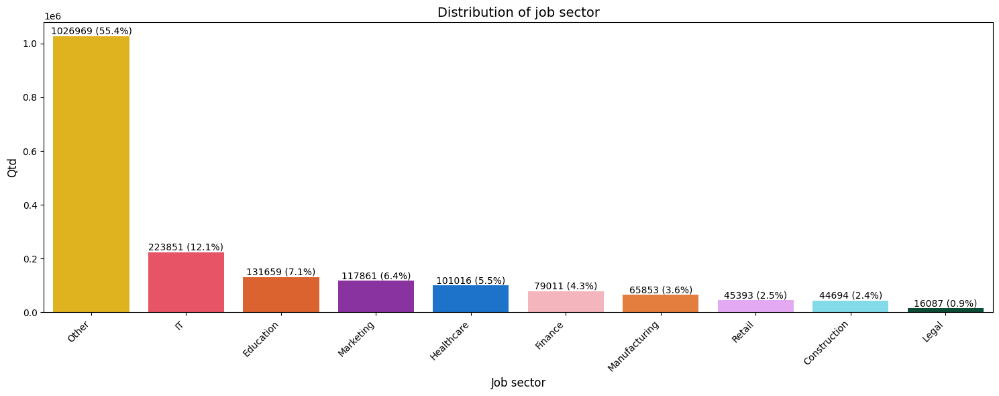

In [73]:
df_complete_pd["job_sector"] = df_complete_pd["job"].apply(assign_sector)

# Contar os setores de trabalho (job_sector)
job = df_complete_pd["job_sector"].value_counts().reset_index()
job.columns = ["job_sector", "count"]  # Renomear as colunas para clareza

# Calcular as porcentagens
total_count = job["count"].sum()  # Soma total de todas as contagens
job["percent"] = (job["count"] / total_count) * 100  # Calcular a porcentagem para cada setor

# Criar o gráfico de barras
plt.figure(figsize=(15, 6))  # Ajustar o tamanho do gráfico

# Criar o gráfico de barras
ax = sns.barplot(
    data=job,
    x="job_sector",  # Setores de trabalho no eixo X
    y="count",       # Contagem no eixo Y
    palette=colors   # Paleta de cores personalizada
)

# Adicionar os rótulos com volume e porcentagem no topo das barras
for bar, count, percent in zip(ax.patches, job["count"], job["percent"]):
    ax.annotate(
        f"{count} ({percent:.1f}%)",  # Formatar como "valor (porcentagem%)"
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),  # Posição no centro e no topo da barra
        ha="center", va="bottom", fontsize=10, color="black"  # Estilo da fonte
    )

# Adicionar rótulos do eixo e título
ax.set_ylabel("Qtd", fontsize=12)  # Rótulo do eixo Y
ax.set_xlabel("Job sector", fontsize=12)  # Rótulo do eixo X
ax.set_title("Distribution of job sector", fontsize=14)  # Título do gráfico

# Melhorar a visualização do eixo X
plt.xticks(rotation=45, ha="right")  # Rotacionar os rótulos para melhorar a legibilidade

# Ajustar o layout para evitar cortes
plt.tight_layout()

# Exibir o gráfico
plt.show()

<ipython-input-74-98dfb396e8fe>:11: UserWarning:

The palette list has more values (12) than needed (10), which may not be intended.



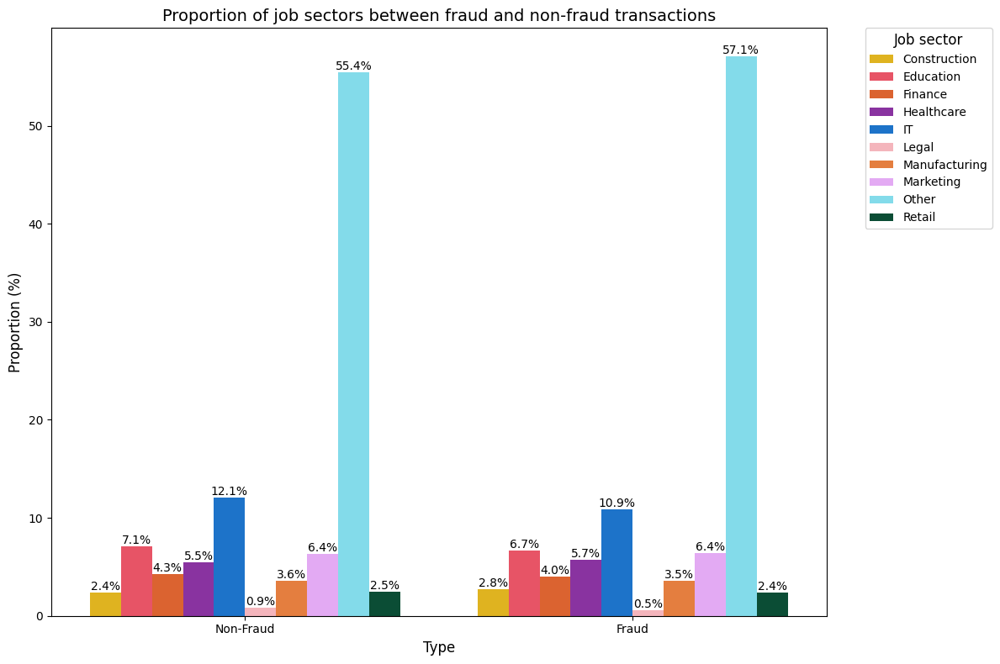

In [74]:
# Contar combinações de setor de trabalho (`job_sector`) e `is_fraud`
job_fraud = df_complete_pd.groupby(["job_sector", "is_fraud"]).size().reset_index(name="count")

# Calcular percentuais (100%) para cada tipo de fraude em relação aos setores
job_fraud["percent"] = job_fraud.groupby("is_fraud")["count"].transform(lambda x: (x / x.sum()) * 100)

# Criar o gráfico de barras empilhadas com `is_fraud` no eixo X
plt.figure(figsize=(12, 8))  # Ajustar o tamanho do gráfico

# Criar o barplot empilhado por setor de trabalho (`job_sector`)
ax = sns.barplot(
    data=job_fraud,
    x="is_fraud",  # Diferenciação entre fraudes e não fraudes no eixo X
    y="percent",   # Percentuais no eixo Y
    hue="job_sector",  # Setores de trabalho representados nas legendas (empilhadas)
    palette=colors # Paleta de cores para categorias distintas
)

# Ajustar rótulos dos eixos e título
ax.set_ylabel("Proportion (%)", fontsize=12)  # Nomear o eixo Y
ax.set_xlabel("Type", fontsize=12)  # Nomear o eixo X
ax.set_title("Proportion of job sectors between fraud and non-fraud transactions", fontsize=14)  # Título

# Colocar rótulos no eixo X (Fraude e Não Fraude)
ax.set_xticks([0, 1])  # Garantir apenas dois rótulos
ax.set_xticklabels(["Non-Fraud", "Fraud"])  # Rótulos personalizados do eixo X

# Adicionar rótulos de valores diretamente nas barras
for container in ax.containers:
    ax.bar_label(container, fmt="%.1f%%", fontsize=10, label_type="edge")  # Exibir percentuais nas barras

# Ajustar a legenda para exibir os setores de trabalho claramente
plt.legend(
    title="Job sector",  # Título da legenda
    bbox_to_anchor=(1.05, 1), loc="upper left",  # Colocar a legenda fora do gráfico
    fontsize=10, title_fontsize=12, borderaxespad=0  # Melhorar a formatação
)

# Ajustar layout para evitar sobreposições
plt.tight_layout()

# Exibir o gráfico
plt.show()

Tem uma concentração um pouco maior em "outros" e em "construction".

### 1.9. Estatísticas de fraude por horário e dia

In [75]:
from pyspark.sql.functions import count

# Agrupar por horário e calcular estatísticas
analise_por_horario = df_complete.groupBy("hour_trnsc").agg(
    # Valores fraudulentos
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_amt"),  # Soma do valor das fraudes
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contagem de fraudes
    # Valores legítimos
    sum(when(col("is_fraud") == 0, col("amt"))).alias("legit_amt"),  # Soma do valor legítimo
    count(when(col("is_fraud") == 0, True)).alias("legit_count"),  # Contagem de transações legítimas
    # Total geral
    sum("amt").alias("total_amt"),  # Soma total de transações
    count("*").alias("total_count")  # Contagem total de transações
).withColumn(
    # Percentual de fraudes no total
    "percent_fraud", round((col("fraude_count") / col("total_count")) * 100, 2)
).withColumn(
    # Percentual de transações legítimas no total
    "percent_legit", round((col("legit_count") / col("total_count")) * 100, 2)
)

# Ordenar por valor total de transações em ordem decrescente
analise_por_horario = analise_por_horario.orderBy(col("hour_trnsc").asc())

# Exibir os resultados
analise_por_horario.show(truncate=False)

+----------+------------------+------------+------------------+-----------+-----------------+-----------+-------------+-------------+
|hour_trnsc|fraude_amt        |fraude_count|legit_amt         |legit_count|total_amt        |total_count|percent_fraud|percent_legit|
+----------+------------------+------------+------------------+-----------+-----------------+-----------+-------------+-------------+
|0         |283487.13         |823         |4480332.160000004 |59832      |4763819.290000003|60655      |1.36         |98.64        |
|1         |296355.7700000001 |827         |4572455.299999994 |60503      |4868811.069999992|61330      |1.35         |98.65        |
|2         |285685.1399999999 |793         |4567315.679999992 |60003      |4853000.819999991|60796      |1.3          |98.7         |
|3         |283917.71         |803         |4547142.850000003 |60165      |4831060.559999999|60968      |1.32         |98.68        |
|4         |19056.53          |61          |4533664.2700000005

In [76]:
# Agrupar por horário e calcular fraudes
fraude_por_horario = df_complete.groupBy("hour_trnsc").agg(
    sum(when(col("is_fraud") == 1, col("amt"))).alias("fraude_amt"),  # Valores fraudulentos
    count(when(col("is_fraud") == 1, True)).alias("fraude_count"),  # Contagem de fraudes
    count("*").alias("total_count")  # Total de transações
).withColumn(
    "percent_fraud", (col("fraude_count") / col("total_count")) * 100  # Percentual de transações fraudulentas
)
# Ordenar por número total de fraudes
fraude_por_horario = fraude_por_horario.orderBy(col("hour_trnsc").asc())
# Exibir os resultados
fraude_por_horario.show(truncate=False)

+----------+------------------+------------+-----------+-------------------+
|hour_trnsc|fraude_amt        |fraude_count|total_count|percent_fraud      |
+----------+------------------+------------+-----------+-------------------+
|0         |283487.13         |823         |60655      |1.3568543401203528 |
|1         |296355.7700000001 |827         |61330      |1.3484428501548997 |
|2         |285685.1399999999 |793         |60796      |1.3043621290874399 |
|3         |283917.71         |803         |60968      |1.317084372129642  |
|4         |19056.53          |61          |59938      |0.10177183089192166|
|5         |24850.890000000003|80          |60088      |0.13313806417254692|
|6         |17451.18          |54          |60406      |0.08939509320266198|
|7         |26586.800000000003|72          |60301      |0.1194010049584584 |
|8         |19680.690000000002|59          |60498      |0.09752388508711032|
|9         |18874.449999999997|61          |60231      |0.10127675117464428|

A concentração de transações fraudulentas é maior de madrugada, enquanto transações legítimas são mais volumosas durante o dia.

<ipython-input-77-bcfe0da70e6e>:5: UserWarning:

The palette list has more values (12) than needed (2), which may not be intended.



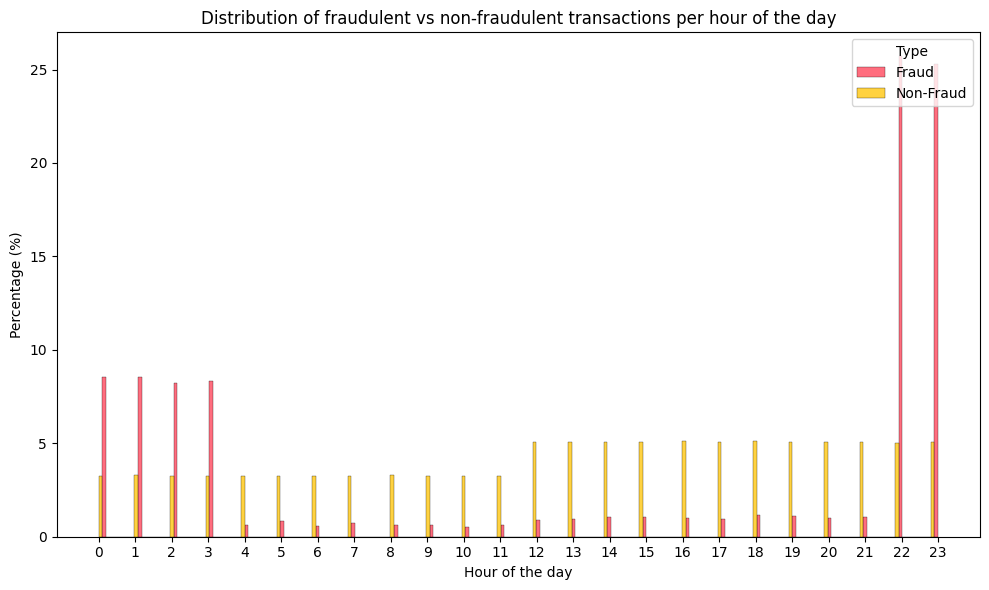

In [77]:
# Gráfico: Distribuição de Fraudes por Hora do Dia
plt.figure(figsize=(10, 6))  # Ajustar o tamanho do gráfico

# Criar o histograma para fraudes e não fraudes ao longo do dia
ax = sns.histplot(
    data=df_complete_pd,
    x="hour_trnsc",  # Utilizar a variável "hour_trnsc" existente
    hue="is_fraud",  # Diferenciar fraudes e não fraudes
    common_norm=False,  # Evitar normalização conjunta
    stat='percent',  # Exibir como percentual
    multiple='dodge',  # Separar as barras lado a lado
    palette=colors  # Aplicar a paleta de cores predefinida
)

# Ajustar os rótulos dos eixos e o título do gráfico
ax.set_ylabel('Percentage (%)')  # Rótulo do eixo Y
ax.set_xlabel('Hour of the day')  # Rótulo do eixo X
plt.title('Distribution of fraudulent vs non-fraudulent transactions per hour of the day')  # Título principal

# Configurar os ticks do eixo X para exibir intervalos completos de 0 a 23 horas
plt.xticks(np.arange(0, 24, 1))  # Marcar todas as horas do dia

# Ajustar a legenda
plt.legend(
    title='Type',  # Título da legenda
    labels=['Fraud', 'Non-Fraud'],  # Rótulos claros
    loc='upper right'  # Posicionar no canto superior direito
)

# Ajustar margens e espaçamento
plt.tight_layout()

# Exibir o gráfico
plt.show()

In [78]:
def day_period(x):
    if x >=0 and x < 6: return "Night"
    elif x>= 6 and x <= 12: return "Morning"
    elif x> 12 and x <= 15: return "Afternoon"
    elif x> 15 and x <= 20: return "Evening"
    elif x> 20 and x <= 24: return "Night"


df_complete_pd["day_period_trnsc"] = df_complete_pd["trans_date_trans_time"].dt.hour.apply(day_period)

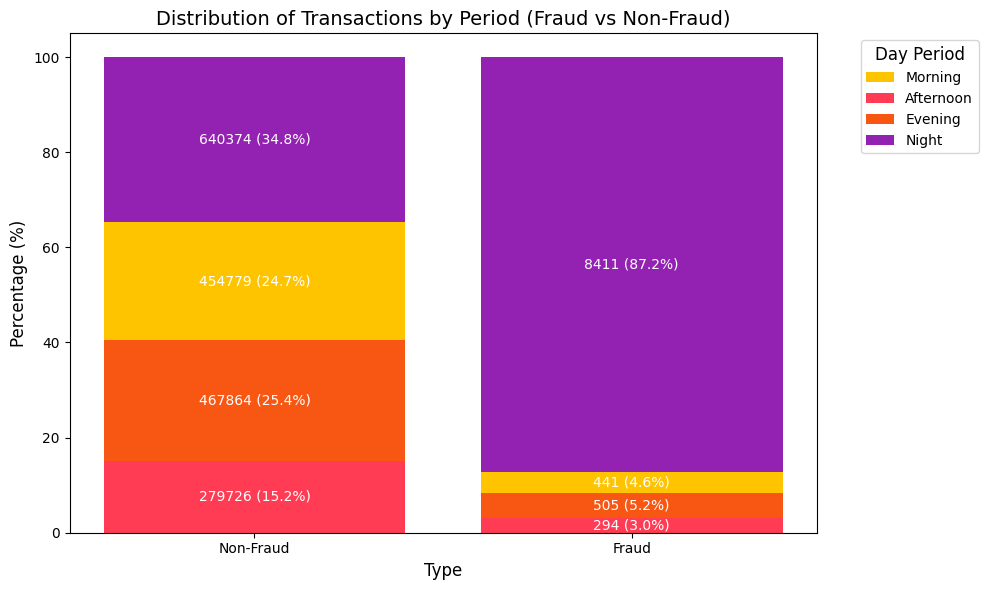

In [79]:
# Agrupando os dados para volume e percentuais para cada combinação de dia e fraude
day_period_fraud = (
    df_complete_pd.groupby(["is_fraud", "day_period_trnsc"])
    .size()
    .reset_index(name="count")  # Contagem de transações por fraude e dia
)

# Calculando o percentual por `is_fraud`
day_period_fraud["percent"] = day_period_fraud.groupby("is_fraud")["count"].transform(lambda x: (x / x.sum()) * 100)

# Create a cumulative sum of percentages within each is_fraud group
# This will be used for text label positioning
day_period_fraud["percent_cumsum"] = day_period_fraud.groupby("is_fraud")["percent"].cumsum()

# Criar uma lista de períodos do dia para controle de ordem
day_period_order = ["Morning", "Afternoon", "Evening", "Night"]  # Ordem desejada
day_period_fraud["day_period_trnsc"] = pd.Categorical(day_period_fraud["day_period_trnsc"], categories=day_period_order, ordered=True)

# Ajustar o dicionário de cores baseado nos períodos do dia
color_map = dict(zip(day_period_order, colors[:len(day_period_order)]))

# Configurar o gráfico
plt.figure(figsize=(10, 6))  # Tamanho ajustado

# Plotar barras empilhadas para cada estágio de `day_period_trnsc` (agora na legenda)
for period in day_period_order:
    subset = day_period_fraud[day_period_fraud["day_period_trnsc"] == period]
    plt.bar(
        subset["is_fraud"].map({0: "Non-Fraud", 1: "Fraud"}),  # Converter is_fraud para texto no eixo X
        subset["percent"],
        label=period,  # Período como legenda
        color=color_map[period],
        # Calculate the bottom position for stacking
        bottom=subset["percent_cumsum"] - subset["percent"],
    )

for i, row in day_period_fraud.iterrows():
    y_position = row["percent_cumsum"] - row["percent"] / 2
    plt.text(
        x="Fraud" if row["is_fraud"] == 1 else "Non-Fraud",
        y=y_position,
        s=f"{row['count']} ({row['percent']:.1f}%)",
        ha="center", va="center", fontsize=10, color="white"
    )

# Configurar título e rótulos dos eixos
plt.title("Distribution of Transactions by Period (Fraud vs Non-Fraud)", fontsize=14)
plt.xlabel("Type", fontsize=12)
plt.ylabel("Percentage (%)", fontsize=12)

# Adicionar legenda
plt.legend(title="Day Period", title_fontsize=12, fontsize=10, loc="upper left", bbox_to_anchor=(1.05, 1))

# Ajustar layout para evitar sobreposições
plt.tight_layout()

# Exibir o gráfico
plt.show()

<ipython-input-80-f5d5b9fd50cf>:8: UserWarning:

The palette list has more values (12) than needed (2), which may not be intended.



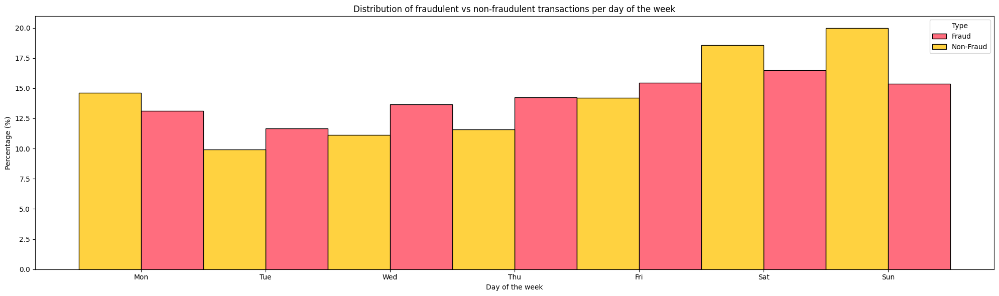

In [80]:
# Converter o campo de data para dia da semana
df_complete_pd['dow'] = pd.to_datetime(df_complete_pd['trans_date_trans_time']).dt.dayofweek
dias_da_semana = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
df_complete_pd['dow'] = df_complete_pd['dow'].replace({i: dias_da_semana[i] for i in range(7)})

# Criar o gráfico de histograma para fraudes e não fraudes por dia da semana
plt.figure(figsize=(20, 6))  # Ajustar o tamanho do gráfico
ax = sns.histplot(
    data=df_complete_pd,
    x="dow",
    hue="is_fraud",  # Diferenciar fraudes e não fraudes
    common_norm=False,  # Evitar normalização conjunta para mostrar proporções reais
    stat='percent',  # Exibir como percentual em vez de contagem bruta
    multiple='dodge',  # Mostrar os grupos lado a lado
    palette=colors  # Usar a paleta de cores predefinida
)

# Ajustar os rótulos do eixo X para exibir os dias da semana
ax.set_xticks(range(7))  # Garantir que os ticks vão de 0 a 6
ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])  # Nome dos dias

# Adicionar rótulos e título ao gráfico
ax.set_ylabel('Percentage (%)')  # Rótulo do eixo Y
ax.set_xlabel('Day of the week')  # Rótulo do eixo X
plt.title('Distribution of fraudulent vs non-fraudulent transactions per day of the week')  # Título principal

# Ajustar a legenda para deixá-la mais clara
plt.legend(
    title='Type',
    labels=['Fraud', 'Non-Fraud'],
    loc='upper right'  # Posicionar a legenda no canto superior direito
)

# Ajustar margens e espaçamento
plt.tight_layout()

# Exibir o gráfico
plt.show()

Fraude é mais comum entre quarta e sexta.

<ipython-input-81-2c94836093da>:8: UserWarning:

The palette list has more values (12) than needed (2), which may not be intended.



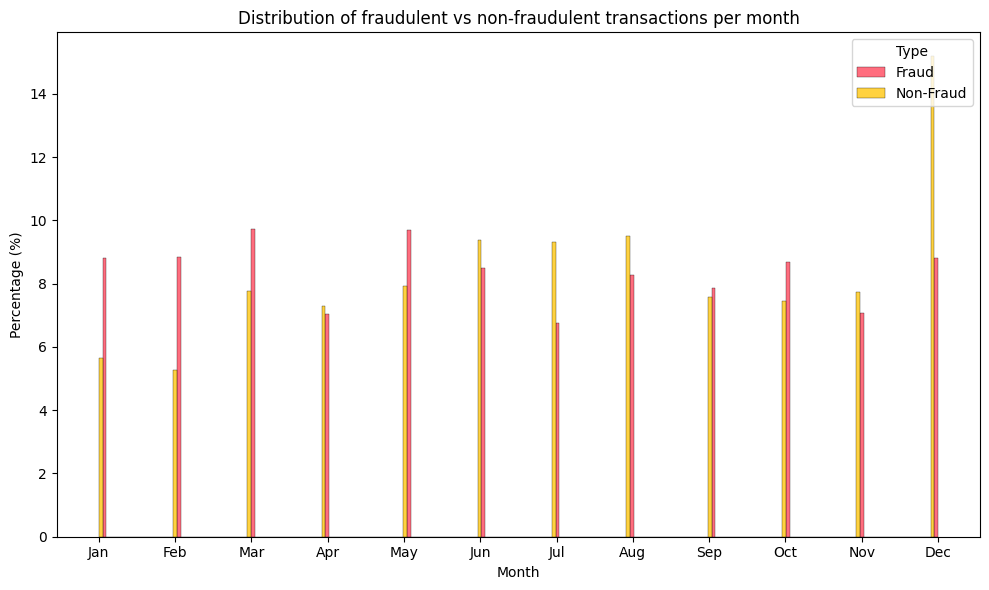

In [81]:
# Criar coluna "month_trnsc" baseada no mês da transação
df_complete_pd['month_trnsc'] = pd.to_datetime(df_complete_pd['trans_date_trans_time']).dt.month

# Gráfico: Distribuição de Fraudes por Mês do Ano
plt.figure(figsize=(10, 6))  # Ajustar o tamanho do gráfico

# Criar o histograma para fraudes e não fraudes ao longo dos meses
ax = sns.histplot(
    data=df_complete_pd,
    x="month_trnsc",  # Utilizar a variável "month_trnsc"
    hue="is_fraud",  # Diferenciar fraudes e não fraudes
    common_norm=False,  # Evitar normalização conjunta
    stat='percent',  # Exibir como percentual
    multiple='dodge',  # Separar barras lado a lado
    palette=colors  # Aplicar a paleta de cores predefinida
)

# Ajustar rótulos dos eixos e título do gráfico
ax.set_ylabel('Percentage (%)')  # Rótulo do eixo Y
ax.set_xlabel('Month')  # Rótulo do eixo X
plt.title('Distribution of fraudulent vs non-fraudulent transactions per month')  # Título principal

# Configurar os ticks e rótulos do eixo X (nomes dos meses)
plt.xticks(
    ticks=np.arange(1, 13, 1),  # Ticks de 1 a 12
    labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']  # Rótulos dos meses
)

# Ajustar a legenda
plt.legend(
    title='Type',  # Título da legenda
    labels=['Fraud', 'Non-Fraud'],  # Rótulos claros
    loc='upper right'  # Posicionar no canto superior direito
)

# Ajustar margens e espaçamento
plt.tight_layout()

# Exibir o gráfico
plt.show()

Fraude é mais comum entre janeiro e maio, no primeiro semestre do ano. Parece ter uma sazonalidade tanto em dia, dia da semana, mês e hora.

In [82]:
df_complete_pd['quarter_1'] = df_complete_pd['trans_date_trans_time'].dt.quarter == 1

### 1.10. Correlação das variáveis com a target

In [83]:
df_complete_pd.columns

Index(['_c0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category', 'amt',
       'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'lat',
       'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time', 'merch_lat',
       'merch_long', 'is_fraud', 'year_trnsc', 'hour_trnsc', 'age', 'log_amt',
       'merchant_fraud_percentage', 'city_fraud_rate', 'distance', 'region',
       'cc_num_fraud_percentage', 'category_gp', 'job_sector',
       'day_period_trnsc', 'dow', 'month_trnsc', 'quarter_1'],
      dtype='object')

##### 1.10.1. Ponto-bisserial para variáveis numéricas com a target

In [84]:
# Lista de colunas numéricas no DataFrame
numeric_columns = ["amt", "log_amt", "city_pop", "age", "distance", "hour_trnsc", "year_trnsc", "merchant_fraud_percentage", "cc_num_fraud_percentage", "city_fraud_rate"]

# Criar uma lista para armazenar os resultados
resultados_correlacao = []

# Total de registros (N)
N = len(df_complete_pd)

# Proporção de fraudes (p) e não fraudes (q)
p = len(df_complete_pd[df_complete_pd["is_fraud"] == 1]) / N
q = 1 - p

# Calcular a correlação para cada coluna numérica
for col_name in numeric_columns:
    # Média e desvio padrão globais
    mean_total = df_complete_pd[col_name].mean()
    std_total = df_complete_pd[col_name].std()

    # Média para is_fraud = 1
    mean_fraud = df_complete_pd[df_complete_pd["is_fraud"] == 1][col_name].mean()

    # Verificar se std_total é válido antes de calcular
    if std_total is not None and std_total > 0:
        # Calcular o coeficiente bisserial de ponto
        r_pb = (mean_fraud - mean_total) / std_total * math.sqrt(p * q)
    else:
        r_pb = np.nan  # Evitar valor inválido se std_total for zero

    # Adicionar o resultado à lista
    resultados_correlacao.append((col_name, r_pb))

# Ordenar os resultados por magnitude (valor absoluto da correlação)
# Use o built-in abs() function
resultados_correlacao = sorted(resultados_correlacao, key=lambda x: builtins.abs(x[1]), reverse=True)

# Exibir os resultados
print("Coeficientes Bisserial de Ponto (Ordenados por Importância):")
for coluna, correlacao in resultados_correlacao:
    print(f"Coluna: {coluna}, Coeficiente Bisserial: {correlacao}")

Coeficientes Bisserial de Ponto (Ordenados por Importância):
Coluna: cc_num_fraud_percentage, Coeficiente Bisserial: 0.3074590670698144
Coluna: city_fraud_rate, Coeficiente Bisserial: 0.2730820889610172
Coluna: amt, Coeficiente Bisserial: 0.20821729406325193
Coluna: log_amt, Coeficiente Bisserial: 0.11371402549820028
Coluna: merchant_fraud_percentage, Coeficiente Bisserial: 0.0684138090813423
Coluna: hour_trnsc, Coeficiente Bisserial: 0.013127086152339517
Coluna: age, Coeficiente Bisserial: 0.010869773841345132
Coluna: year_trnsc, Coeficiente Bisserial: -0.005990293472915068
Coluna: distance, Coeficiente Bisserial: 0.0003572965720039053
Coluna: city_pop, Coeficiente Bisserial: 0.0003235000556415139


As variáveis de percentual de fraude por cartão e valor da transação são as que melhor se correlacionam com 'is_fraud'.

##### 1.10.2. Qui-Quadrado para demais variáveis categóricas

In [85]:
# Lista de colunas categóricas
categorical_columns = ["merchant", "category", "job", "gender", "state", "region", "city", "job_sector", "day_period_trnsc", "dow", "month_trnsc", "quarter_1", "category_gp"]

# Inicializar lista para salvar resultados do teste Qui-Quadrado
chi_square_results = []

# Executar o teste para cada coluna categórica
for col_name in categorical_columns:
    # Criar uma tabela de contigência entre a variável categórica e `is_fraud`
    contingency_table = pd.crosstab(df_complete_pd[col_name], df_complete_pd["is_fraud"])

    # Executar o teste de Qui-Quadrado
    chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

    # Salvar os resultados
    chi_square_results.append((col_name, chi2_stat, p_value))

# Transformar os resultados em um DataFrame
chi_square_results_df = pd.DataFrame(chi_square_results, columns=["Column", "Chi-Square", "P-value"])

# Ordenar os resultados pelo valor-p (do menor para o maior)
chi_square_results_df = chi_square_results_df.sort_values(by="P-value")

# Exibir os resultados
print("Resultados do Teste Qui-Quadrado:")
print(chi_square_results_df)

Resultados do Teste Qui-Quadrado:
              Column     Chi-Square        P-value
0           merchant    8761.093874   0.000000e+00
1           category    8329.139946   0.000000e+00
2                job   48073.228172   0.000000e+00
4              state    2022.122832   0.000000e+00
6               city  139590.937427   0.000000e+00
8   day_period_trnsc   11584.451401   0.000000e+00
10       month_trnsc     865.679577  1.476427e-178
11         quarter_1     478.988029  3.547699e-106
9                dow     290.758047   7.809807e-60
3             gender      63.091041   1.973697e-15
7         job_sector      39.548415   9.171871e-06
5             region      11.858985   7.882164e-03
12       category_gp       0.000000   1.000000e+00


Todas as variáveis estão bem associadas com 'is_fraud'. No entanto, variáveis como "merchant", "city", "job" possuem muitas categorias, o que acarreta na maldição da dimensionalidade. Por causa disso, vou priorizar colunas melhor agrupadas.

## 2.0 Pré-processamento das colunas

Vou utilizar apenas as colunas listadas abaixo na modelagem, uma vez que algumas delas possuíram alta dimensionalidade e outras não discriminaram a identificação de fraude.

In [86]:
model_columns = ['amt', 'cc_num_fraud_percentage', 'merchant_fraud_percentage', 'city_fraud_rate', 'category', 'age', 'gender', 'region', 'job_sector', 'day_period_trnsc', 'dow', 'quarter_1']

In [87]:
df_train.select("trans_num").toPandas().to_csv("train_trans_num.csv", index=False)
df_test.select("trans_num").toPandas().to_csv("test_trans_num.csv", index=False)

In [88]:
# Carregar listas de trans_num
train_trans_num = pd.read_csv("train_trans_num.csv")
test_trans_num = pd.read_csv("test_trans_num.csv")

# Filtrar usando merge para identificação
df_train = (
    df_complete_pd
    .merge(train_trans_num, on="trans_num", how="inner")
)

df_test = (
    df_complete_pd
    .merge(test_trans_num, on="trans_num", how="inner")
)

In [89]:
# Exibir as primeiras 5 linhas do DataFrame Pandas
df_train.head()

,_c0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,city_fraud_rate,distance,region,cc_num_fraud_percentage,category_gp,job_sector,day_period_trnsc,dow,month_trnsc,quarter_1
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,0.375811,78.597568,South,0.003758,other,Legal,Night,Tue,1,True
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,0.215983,30.212176,West,0.001605,other,Education,Night,Tue,1,True
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,1.088435,108.206083,West,0.010884,other,Other,Night,Tue,1,True
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,2.018843,95.673231,West,0.020188,other,Legal,Night,Tue,1,True
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,0.444901,77.556744,South,0.004449,other,Healthcare,Night,Tue,1,True


In [90]:
# Verificando se os tipos de variáveis estão definidos corretamente

pd.DataFrame(df_train[model_columns].dtypes)

,0
amt,float64
cc_num_fraud_percentage,float64
merchant_fraud_percentage,float64
city_fraud_rate,float64
category,object
age,int32
gender,object
region,object
job_sector,object
day_period_trnsc,object


In [91]:
# Separação de features e target
X_train = df_train[model_columns]
y_train = df_train['is_fraud']

X_test = df_test[model_columns]
y_test = df_test['is_fraud']

In [92]:
# Pré-processamento automático, com base nos tipos das variáveis
pre_processamento = ColumnTransformer(
    transformers = [
        ('num', StandardScaler(), make_column_selector(dtype_include = ['int64', 'float64'])),
        ('cat', OneHotEncoder(drop = 'first'), make_column_selector(dtype_include = ['object', 'category']))
    ],
    remainder = 'passthrough')

In [93]:
# Aplicação do pré-processamento
X_train_transformed = pre_processamento.fit_transform(X_train)
X_test_transformed = pre_processamento.transform(X_test)

Decidi utilizar a técnica de SMOTE combinado com undersampling para lidar com o desbalanceamento extremo dos dados (0.5% de fraudes). O SMOTE permite enriquecer a classe minoritária gerando exemplos sintéticos próximos aos dados reais, enquanto o undersampling reduz a classe majoritária para evitar que domine o aprendizado do modelo. Assim, consigo equilibrar melhor meu conjunto de dados sem perder muita informação da classe majoritária.

In [94]:
# SMOTE + Undersampling
smote = SMOTE(sampling_strategy=0.05, random_state=42)  # Classe minoritária será 5% do tamanho da majoritária
undersampler = RandomUnderSampler(sampling_strategy=0.7, random_state=42)  # Classe majoritária será reduzida para 70% da minoritária gerada

# Pipeline: Combinação SMOTE + Undersampling
pipeline = Pipeline([
    ('smote', smote),
    ('undersampler', undersampler)
])

# Aplicar o balanceamento ao treino
X_train_balanced, y_train_balanced = pipeline.fit_resample(X_train_transformed, y_train)

# Verificar a nova distribuição das classes
print(f"Antes do balanceamento: {Counter(y_train)}")
print(f"Depois do balanceamento: {Counter(y_train_balanced)}")

Antes do balanceamento: Counter({0: 1289169, 1: 7506})
Depois do balanceamento: Counter({0: 92082, 1: 64458})


Com isso, o dataset de treino ficou com 156.540 transações, sendo 41% delas fraude.

In [95]:
print(type(X_train_balanced))
print(X_train_balanced.shape)
print(type(y_train_balanced))

<class 'scipy.sparse._csr.csr_matrix'>
(156540, 42)
<class 'pandas.core.series.Series'>


In [96]:
X_train_final = X_train_balanced.toarray()
y_train_final = y_train_balanced.to_numpy()

In [97]:
# Mensagens de debug para confirmar o formato correto
print(f"Features - Tipo: {type(X_train_final)}, Shape: {X_train_final.shape}")
print(f"Target - Tipo: {type(y_train_final)}, Shape: {y_train_final.shape}")

Features - Tipo: <class 'numpy.ndarray'>, Shape: (156540, 42)
Target - Tipo: <class 'numpy.ndarray'>, Shape: (156540,)


## 3.0 Encontrando o melhor modelo

### 3.1. Comparação de modelos

In [ ]:
# Lista de algoritmos e hiperparâmetros testados
modelos = {
    'REGRESSÃO LOGÍSTICA': (LogisticRegression(), {
        'fit_intercept': [True]
    }),
    'ÁRVORE DE DECISÃO': (DecisionTreeClassifier(), {
        'criterion': ['gini', 'entropy'],
        'min_impurity_decrease': np.arange(0.02, 0.05, 0.01),
        'min_samples_leaf': np.arange(1000, 2000, 100),
        'max_depth': np.arange(5, 10)
    }),
    'FLORESTA ALEATÓRIA': (RandomForestClassifier(n_jobs = -1), {
        'n_estimators': np.arange(20, 201, 10),
        'criterion': ['gini', 'entropy'],
        'min_impurity_decrease': np.arange(0.02, 0.05, 0.01),
        'min_samples_leaf': np.arange(1000, 2000, 100),
        'max_depth': np.arange(5, 10)
    }),
    #'ADABOOST': (AdaBoostClassifier(), {
     #   'n_estimators': np.arange(20, 201, 10),
     #   'learning_rate': np.arange(0.01, 0.51, 0.01)
    #}),
    #'GRADIENT BOOSTING': (GradientBoostingClassifier(), {
     #   'n_estimators': np.arange(10, 201, 10),
     #   'learning_rate': np.arange(0.01, 0.51, 0.01),
     #   'max_depth': np.arange(2, 11),
     #   'min_samples_leaf': np.arange(1000, 2000, 100)
    #}), # NÃO VOU RODAR ESSES DOIS PORQUE DEMORA DEMAIS! ATÉ TENTEI.
    'XGBOOST': (XGBClassifier(n_jobs = -1), {
        'n_estimators': np.arange(10, 201, 10),
        'learning_rate': np.arange(0.01, 0.51, 0.01),
        'max_depth': np.arange(2, 11),
        'min_child_weight': np.arange(1, 11),
        'gamma': np.arange(0, 1.1, 0.1)
    }),
    'LIGHTGBM': (LGBMClassifier(verbose = -1, n_jobs = -1), {
        'n_estimators': np.arange(10, 201, 10),
        'learning_rate': np.arange(0.01, 0.51, 0.01),
        'max_depth': np.arange(2, 11),
        'min_data_in_leaf': np.arange(1000, 2000, 100)
    })
}

In [ ]:
# Quantidade de folds nas camadas interna e externa
inner_cv = KFold(n_splits = 3, shuffle = True, random_state = 123)
outer_cv = KFold(n_splits = 5, shuffle = True, random_state = 123)

In [ ]:
# Auxiliares para armazenamento do melhor modelo
melhor_algoritmo = ""
melhor_modelo = None
melhor_score = float('-inf')

# Avaliação de modelos por validação cruzada
for nome, (algoritmo, parametros) in modelos.items():
    try:
        # Métricas de interesse
        scoring = {'AUC': 'roc_auc', 'balanced_accuracy': 'balanced_accuracy', 'recall': 'recall'}

        # Escolha entre grid search ou random search. No random search, altere a métrica que deseja otimizar em 'refit' e a quantidade de iterações, se for necessário
        random_search = RandomizedSearchCV(algoritmo, parametros, cv=inner_cv, scoring=scoring, refit='AUC', n_iter=50, random_state=123, n_jobs=-1)
        nested_scores = cross_validate(random_search, X=X_train_final, y=y_train_final, cv=outer_cv, scoring=scoring, n_jobs=-1)

        # Verificando se o modelo atual é o melhor
        if np.mean(nested_scores['test_AUC']) > melhor_score:
            melhor_algoritmo = nome
            melhor_modelo = random_search
            melhor_score = np.mean(nested_scores['test_AUC'])

        # Resultados
        # Observação: os cálculos de acurácia balanceada e sensibilidade consideram ponto de corte = 0,50 por padrão; logo, só devem ser considerados para bases balanceadas
        print(f'--- {nome} ---')
        print(f"Média de AUC: {np.mean(nested_scores['test_AUC']):.3f}")
        print(f"D.P. de AUC: {np.std(nested_scores['test_AUC']):.3f}")
        print(f"Média de Acurácia Balanceada: {np.mean(nested_scores['test_balanced_accuracy']):.3f}")
        print(f"D.P. de Acurácia Balanceada: {np.std(nested_scores['test_balanced_accuracy']):.3f}")
        print(f"Média de Sensibilidade: {np.mean(nested_scores['test_recall']):.3f}")
        print(f"D.P. de Sensibilidade: {np.std(nested_scores['test_recall']):.3f}")
        print("")

    except Exception as e:
        warnings.warn(f"Erro ao avaliar o modelo {nome}: {e}")

print(f"O melhor algoritmo é {melhor_algoritmo}, para os valores de hiperparâmetros testados.")

--- REGRESSÃO LOGÍSTICA ---
Média de AUC: 0.960
D.P. de AUC: 0.001
Média de Acurácia Balanceada: 0.875
D.P. de Acurácia Balanceada: 0.003
Média de Sensibilidade: 0.825
D.P. de Sensibilidade: 0.005

--- ÁRVORE DE DECISÃO ---
Média de AUC: 0.973
D.P. de AUC: 0.001
Média de Acurácia Balanceada: 0.927
D.P. de Acurácia Balanceada: 0.002
Média de Sensibilidade: 0.933
D.P. de Sensibilidade: 0.003

--- FLORESTA ALEATÓRIA ---
Média de AUC: 0.963
D.P. de AUC: 0.003
Média de Acurácia Balanceada: 0.861
D.P. de Acurácia Balanceada: 0.002
Média de Sensibilidade: 0.734
D.P. de Sensibilidade: 0.004



/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



--- XGBOOST ---
Média de AUC: 1.000
D.P. de AUC: 0.000
Média de Acurácia Balanceada: 0.993
D.P. de Acurácia Balanceada: 0.000
Média de Sensibilidade: 0.991
D.P. de Sensibilidade: 0.000

--- LIGHTGBM ---
Média de AUC: 1.000
D.P. de AUC: 0.000
Média de Acurácia Balanceada: 0.993
D.P. de Acurácia Balanceada: 0.000
Média de Sensibilidade: 0.991
D.P. de Sensibilidade: 0.000

O melhor algoritmo é LIGHTGBM, para os valores de hiperparâmetros testados.


### 3.2. Ajuste de modelo final na base de treino, usando validação cruzada

In [ ]:
# Quantidade de folds (substitua KFold por StratifiedKFold se necessário)
cv = KFold(n_splits = 10, shuffle = True, random_state = 123)

In [ ]:
# Métricas de interesse
scoring = {'AUC': 'roc_auc', 'balanced_accuracy': 'balanced_accuracy', 'recall': 'recall'}

In [ ]:
# Escolha entre grid search ou random search. No random search, altere a métrica que deseja otimizar em 'refit' e a quantidade de iterações, se for necessário
# modelo_final = GridSearchCV(melhor_modelo.estimator, modelos[melhor_algoritmo][1], cv = cv, scoring = scoring, refit = 'AUC', n_jobs = -1)
modelo_final = RandomizedSearchCV(melhor_modelo.estimator, modelos[melhor_algoritmo][1], cv = cv, scoring = scoring, refit = 'AUC', n_iter = 50, random_state = 123, n_jobs = -1)
modelo_final.fit(X_train_final, y_train_final)

print(f"Melhores hiperparâmetros para {melhor_algoritmo}: {modelo_final.best_params_}")

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



Melhores hiperparâmetros para LIGHTGBM: {'n_estimators': np.int64(100), 'min_data_in_leaf': np.int64(1000), 'max_depth': np.int64(9), 'learning_rate': np.float64(0.31)}


### 3.3. Importância das features do modelo final

In [ ]:
# Auxiliar: nomes das features após pré-processamento
features = pre_processamento.get_feature_names_out()

In [ ]:
# Cálculo de medida de importância de Gini
importancias = modelo_final.best_estimator_.feature_importances_

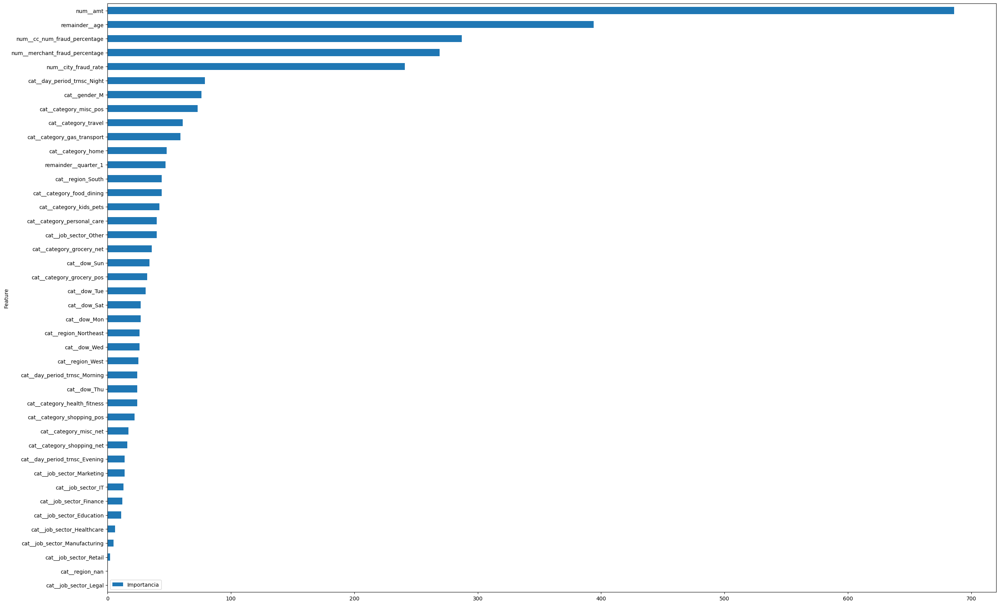

In [ ]:
# Gráfico das importâncias de Gini
df_importancias = pd.DataFrame({'Feature': features, 'Importancia': importancias}).sort_values(by = 'Importancia', ascending = True)
df_importancias.plot.barh(x = 'Feature', y = 'Importancia', figsize = (30, 20))
plt.show()

In [ ]:
# Cálculo de valores SHAP para as observações
explainer = shap.Explainer(modelo_final.best_estimator_)
valores_shap = explainer(X_train_final)

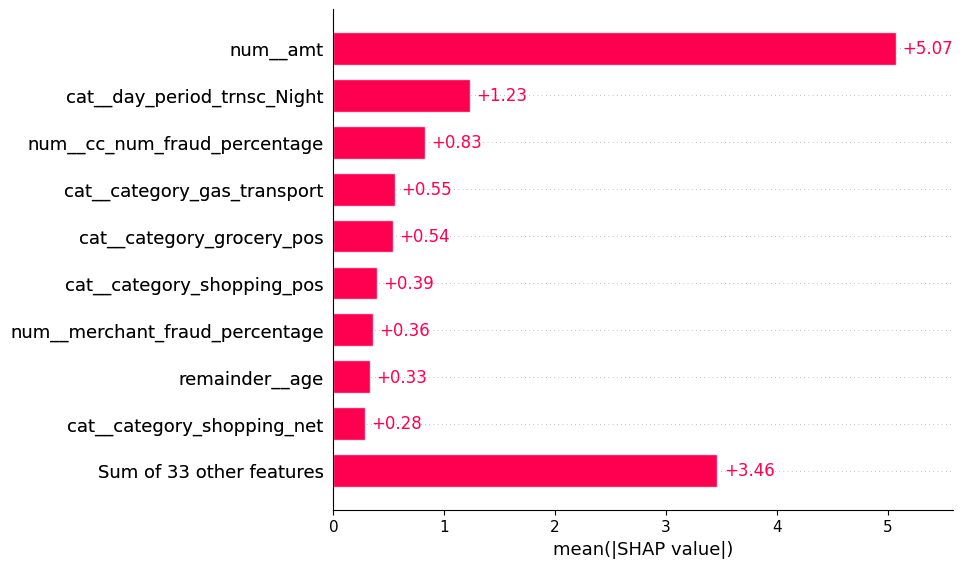

In [ ]:
# Gráfico do SHAP absoluto médio por feature
if melhor_algoritmo == 'ÁRVORE DE DECISÃO' or melhor_algoritmo == 'FLORESTA ALEATÓRIA':
  shap.plots.bar(shap.Explanation(values = valores_shap[:,:,0], feature_names = features))
else:
  shap.plots.bar(shap.Explanation(values = valores_shap, feature_names = features))

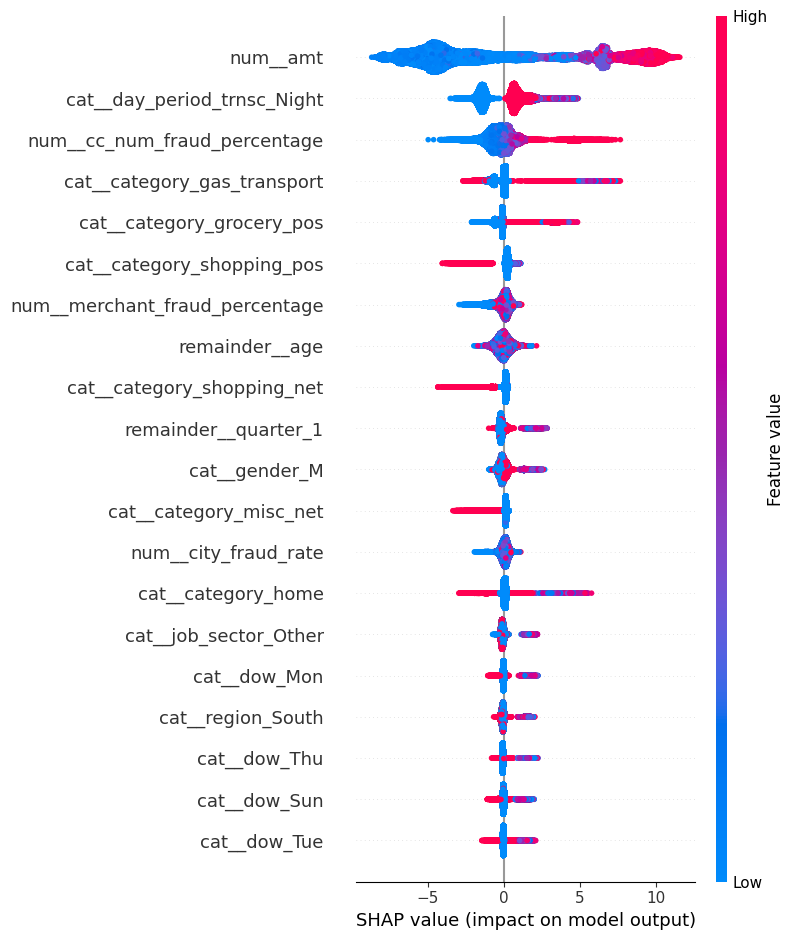

In [ ]:
# Gráfico de distribuição de valores SHAP por feature: "enxame de abelhas" (beeswarm plot)
if melhor_algoritmo == 'ÁRVORE DE DECISÃO' or melhor_algoritmo == 'FLORESTA ALEATÓRIA':
  shap.summary_plot(shap.Explanation(values = valores_shap[:,:,0], feature_names = features))
else:
  shap.summary_plot(shap.Explanation(values = valores_shap, feature_names = features))

## 4.0 Aplicação do modelo na base de teste

In [101]:
df_test.groupby("is_fraud")["is_fraud"].count()

,is_fraud
is_fraud,
0,553574
1,2145


In [105]:
# Aplicação do modelo (cálculo das probabilidades preditas)
y_prob = modelo_final.best_estimator_.predict_proba(X_test_transformed)[:,1]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000


In [106]:
# Definição de ponto de corte - ajustado com base na proporção de fraude da base de teste
ponto_corte = df_test.is_fraud.mean()

In [107]:
# Atribuição da categoria predita
df_test['y_pred'] = (y_prob >= ponto_corte).astype(int)

In [108]:
# Tabela de classificação: real vs. predito (frequências absolutas)
pd.crosstab(df_test['is_fraud'], df_test['y_pred'])

y_pred,0,1
is_fraud,,
0,500713,52861
1,16,2129


In [109]:
# Tabela de classificação: real vs. predito (frequências relativas)
pd.crosstab(df_test['is_fraud'], df_test['y_pred'], normalize = 'index').round(3) * 100

y_pred,0,1
is_fraud,,
0,90.5,9.5
1,0.7,99.3


In [110]:
# Identificar falsos positivos e falsos negativos
df_test["false_positive"] = (df_test["is_fraud"] == 0) & (df_test["y_pred"] == 1)
df_test["false_negative"] = (df_test["is_fraud"] == 1) & (df_test["y_pred"] == 0)

False Positive: 52861 (9.55%)
False Negative: 16 (0.75%)


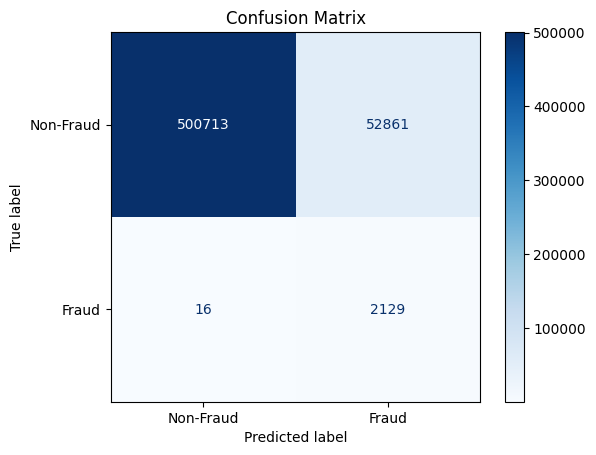

In [111]:
# Gerar matriz de confusão
cm = confusion_matrix(df_test["is_fraud"], df_test["y_pred"])

# Extrair valores da matriz de confusão
tn, fp, fn, tp = cm.ravel()

# Calcular total de instâncias em cada classe
total_reprovado = tn + fp
total_aprovado = fn + tp

# Calcular porcentagens
fp_percentage = (fp / total_reprovado) * 100
fn_percentage = (fn / total_aprovado) * 100

print(f"False Positive: {fp} ({fp_percentage:.2f}%)")
print(f"False Negative: {fn} ({fn_percentage:.2f}%)")

# Plotar a matriz de confusão
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud', 'Fraud'])
fig, ax = plt.subplots()
disp.plot(cmap=plt.cm.Blues, ax=ax, values_format='d')
plt.title('Confusion Matrix')
plt.show()

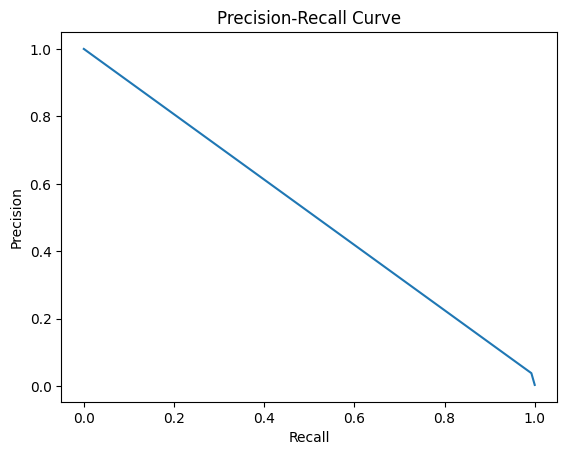

In [112]:
from sklearn.metrics import ConfusionMatrixDisplay, precision_recall_curve, average_precision_score

# Curva precision-recall
precision, recall, _ = precision_recall_curve(df_test.is_fraud, df_test.y_pred)
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

In [113]:
# Total de perda antes do modelo
fator_prejuizo = 0.7  # 70% de prejuízo real por transação fraudulenta
perda_total = df_test[df_test.is_fraud == 1].amt.sum() * fator_prejuizo
print(f"Total de perda antes do modelo: R$ {perda_total:,.2f}")

Total de perda antes do modelo: R$ 793,327.28


In [120]:
# Cálculos
perda_evitada = df_test[(df_test.is_fraud == 1) & (df_test.y_pred == 1)].amt.sum() * fator_prejuizo

fator_recuperacao = 0.95  # Assume-se que 95% das transações barradas indevidamente são recuperadas
receita_perdida = df_test[(df_test.is_fraud == 0) & (df_test.y_pred == 1)].amt.sum() * (1 - fator_recuperacao)

valor_liquido = perda_evitada - receita_perdida


# Impressão formatada
print(f"Perda evitada: R$ {perda_evitada:,.2f}")
print(f"Receita perdida: R$ {receita_perdida:,.2f}")
print(f"Valor líquido gerado pelo modelo: R$ {valor_liquido:,.2f}")

Perda evitada: R$ 792,852.02
Receita perdida: R$ 306,928.35
Valor líquido gerado pelo modelo: R$ 485,923.67
